# Experiment: ADLO (v3a) - Spatial Accuracy / Information Flow

CNNs are not good at passing spatial information around, but I want to use a CNN for just that. There's a few ways of augmenting the basic CNN architecture for spatial information flow. This notebook looks at the accuracy obtained against a simple problem and when using different low-level solutions.

## Results & Theories
### 2x2 One-hot Encoding
Surprisingly, the pure CNN architectures are able to identify the single corner location to within 1 to 3px. So it's possible for an unmodified CNN to convey spatial information. The question is how.

Take a single 2x2 patch that will become 1x1 following maxpool. One theory is that it can use 4 channels to encode the same feature, but at each of the 4 offsets. Only one will have the best match. Max-pool will convert the 2x2x4 patch into 1x1x4, with the channel with the highest value indicating its corresponding source position as the location of the feature. In other words, _one-hot encoding_.

In order to retain full accuracy in the next block, it will take another 2x2 grid of 4 channels, but multiplied by the 4-channel input, giving 16 channels in the new one-hot encoding. Or, put another way, the next block's maxpool output has 4x4=16 possible sources, so needs to encode with 16channels for one-hot encoding.

Thus, in theory, a network with blocks of the form (1conv + 1maxpool), with stride $s$, require an exponential increase in the number of channels ($c$) at each block ($b \in 1,..,B$), as follows:
$$
c = s^{2b}
$$

If there's less than that, then the accuracy will be _clipped_. For example, if we restrict to 16 channels throughout, then the final block will only identify the grid-cell in the second-to-last block, without identifying where in that grid-cell.

### 2x2 One-hot Encoding with Compression
For the more common conv network with multiple conv layers before block, it may be able to compress the encoding. For example, a 4-channel one-hot encoding can be easily compressed into a single channel having values in 4 ranges. You convert the one-hot encoding to so called "sparse encoding" (ie: argmax) and divide by 4.

There's a few ways to achieve this. One is by thresholding at the one-hot encoding layer (with the hope of having only a single channel still non-zero), multiplying by different weights and summing. Another is to acknowledge that the channels are probably already fairly well globally normalised because the same weights are used at all positions, and because backprop could induce that outcome if the loss surface implies it. And also to acknowledge that in this simple experiment, non-matches are probably very close to zero. At that point, you can simply assume they're close enough to perfectly 0.0 or 1.0, and then just sum them with different weights. For example, if the channels are a, b, c, d, then the equivalent 1-channel encoding is produced via:
$$
  \text{value} = 1a + 2b + 3c + 4d
$$

That can be done in a single conv layer, leaving the activation function available for part of any other processing.

Conceivably, this architecture could work with a very small number of channels.

### Other Learnings
* The dangers of single channels
  * Whole channels can easily be dead. I experienced this very problem with my first multi-spatial network. It concatenated and then mapped all the spatial resolutions and finally output as a greyscale image that would be soft-arg-maxed to determine the coordinate of the peak. But the entire channel had a tendency to be dead from initialization.
  * Using multiple channels minimises that risk, because the chance of all channels being dead is very low, so the model can learn from there.
  * When the output is a single channel, it's ok so long as you don't use ReLU or any other non-linearity that could start saturated.

In [1]:
# Clone repo and load its modules
import os
import sys
if os.path.isdir('repo'):
  # discard any local changes and update
  !cd repo && git reset --hard HEAD
  !cd repo && git fetch
else:
  !git clone https://github.com/malcolmlett/robovac.git repo

# lock to revision
#!cd repo && git checkout be28234
!cd repo && git pull
sys.path.append('repo')

# Install Training Instrumentation Toolkit
# (locked to specific git revision so this notebook always works)
if not os.path.isdir('training-instrumentation-toolkit'):
  !git clone https://github.com/malcolmlett/training-instrumentation-toolkit.git
  !cd training-instrumentation-toolkit && git checkout 550ac65
sys.path.append('training-instrumentation-toolkit')

from general_utils import display_history
import lds
import slam_models
import slam_data
import slam_operations
import train_instrumentation as tinstr
from importlib import reload
reload(lds)
reload(slam_models)
reload(slam_data)
reload(slam_operations)

Cloning into 'repo'...
remote: Enumerating objects: 957, done.
remote: Counting objects: 100% (54/54), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 957 (delta 44), reused 49 (delta 41), pack-reused 903 (from 1)
Receiving objects: 100% (957/957), 140.81 MiB | 21.96 MiB/s, done.
Resolving deltas: 100% (530/530), done.
Updating files: 100% (61/61), done.
Already up to date.
Cloning into 'training-instrumentation-toolkit'...
remote: Enumerating objects: 1645, done.
remote: Counting objects: 100% (205/205), done.
remote: Compressing objects: 100% (148/148), done.
remote: Total 1645 (delta 135), reused 109 (delta 57), pack-reused 1440 (from 2)
Receiving objects: 100% (1645/1645), 247.86 MiB | 15.39 MiB/s, done.
Resolving deltas: 100% (992/992), done.
Note: switching to '550ac65'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by swi

<module 'slam_operations' from '/content/repo/slam_operations.py'>

In [2]:
# Load standard libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
import IPython.display as idisplay
import os
import sys
import math
import tqdm
import time
from timeit import default_timer as timer
import cv2
import re

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tf.keras.__version__}")
print(f"Python version: {sys.version}")

TensorFlow version: 2.18.0
Keras version: 3.8.0
Python version: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]


## Helpful Functions

In [3]:
def predict_all(model, dataset):
  preds = model.predict(dataset)
  return preds

def quick_show_preds(model, dataset):
  preds = predict_all(model, dataset)

  print(f"pred.x: {np.min(preds[:,0])}..{np.max(preds[:,0])}")
  print(f"pred.y: {np.min(preds[:,1])}..{np.max(preds[:,1])}")

  plt.figure(figsize=(5,2), layout='constrained')
  plt.subplot(1, 2, 1)
  plt.title("pred.x")
  plt.hist(preds[:,0], bins=20)
  plt.ylabel('histogram')

  plt.subplot(1, 2, 2)
  plt.title("pred.y")
  plt.hist(preds[:,1], bins=20)
  plt.ylabel('histogram')

  plt.show()

# Assuming one-hot-encoding theory and no representational compression
# using s^(2b) to calculate required number of channels for perfect resolution:
def calculate_onehotencoding_theory(strides, blocks, max_channels):
  s=strides
  b=blocks
  f=max_channels
  eff_b=math.log(f)/math.log(s)/2
  eff_res=149/(2**eff_b)
  print(f"Assuming one-hot-encoding theory and no representational compression:")
  print(f"  Required channels in last block for perfect resolution:  {s**(2*b):,}")
  print(f"  Effective resolution at {f} channels (in blocks):        {eff_b}")
  print(f"  Effective resolution at {f} channels (in pixels):        {eff_res}")
calculate_onehotencoding_theory(strides=2, blocks=7, max_channels=128)

Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  16,384
  Effective resolution at 128 channels (in blocks):        3.5
  Effective resolution at 128 channels (in pixels):        13.169863799599447


In [4]:
def plot_hist(data, bins=10):
  # efficient equivalent of plt.hist()
  counts, bin_edges = np.histogram(tf.reshape(data, [-1]), bins=bins)
  bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
  bin_widths = np.diff(bin_edges)
  plt.bar(bin_centers, counts, width=bin_widths)

In [5]:
def index_layers_by_name_pattern(model, name_pattern):
    return [l_idx for l_idx, layer in enumerate(model.layers) if re.fullmatch(name_pattern, layer.name)]

def coords_to_rgb(coord_grid):
    coord_grid = coord_grid + 0.5
    blue = 1.0 - tf.sqrt(tf.reduce_sum(tf.square(coord_grid), axis=-1))
    blue = tf.clip_by_value(blue, 0.0, 1.0)  # gives a stronger distinction than RMS or simple mean
    return tf.stack([coord_grid[..., 0], coord_grid[..., 1], blue], axis=-1)

def flatten_channels(tensor, reduction='pos-norm'):
  if reduction == 'norm':
    return tf.sqrt(tf.reduce_mean(tf.square(tensor), axis=-1))
  elif reduction == 'pos-norm':
    tensor = tf.clip_by_value(tensor, 0.0, float('inf'))
    return tf.sqrt(tf.reduce_mean(tf.square(tensor), axis=-1))
  else:
    raise ValueError(f"Invalid reduction: {reduction}")

def plot_layers(model, dataset, layer_filter, has_coord_channels=False, has_coord_layers=None, num=1):
    """
    Args:
      - has_coord_layers - included for backwards compatibility. Wrong name. If specified, overrides has_coord_channels.
    """
    if has_coord_layers is not None:
        has_coord_channels = has_coord_layers
    layer_indices = index_layers_by_name_pattern(model, layer_filter)

    # prepare model
    monitoring_model = tf.keras.Model(
        inputs=tinstr._original_inputs(model),
        outputs=[model.outputs] + [layer.output for layer in model.layers])

    # do prediction
    dataset = dataset.take(num).batch(num)
    data = next(iter(dataset))[0]
    out = monitoring_model(data)
    prediction = out[0][0]
    layer_outputs = out[1:]
    print(f"prediction:      {prediction}")
    print(f"all layers:      {[t.shape for t in layer_outputs]}")
    print(f"filtered layers: {[layer_outputs[l_idx].shape for l_idx in layer_indices]}")

    coord_layer = None
    coord_grid_indices = index_layers_by_name_pattern(model, r'coord_grid2d_.*')
    if has_coord_channels and len(coord_grid_indices) > 0:
        coord_layer = layer_outputs[coord_grid_indices[0]]

    cols = 1 + len(layer_indices)
    if coord_layer is not None:
        cols += 1
    rows = num * 2 if has_coord_channels else num

    plt.figure(figsize=(15, 2 * rows), layout='constrained')

    for idx in range(num):
        row = idx * 2 if has_coord_channels else idx
        col = 0
        plt.subplot(rows, cols, 1 + (row * cols) + col)
        plt.title(f"input (data #{idx})")
        plt.imshow(data[idx, :, :, 0])
        plt.axis('off')

        if has_coord_channels:
            if coord_layer is not None:
                col += 1
                plt.subplot(rows, cols, 1 + (row * cols) + col)
                plt.title(f"coord")
                plt.imshow(coords_to_rgb(coord_layer[idx, :, :, -2:]))
                plt.axis('off')

            for l_idx in layer_indices:
                layer = model.layers[l_idx]
                layer_data = layer_outputs[l_idx]
                col += 1
                plt.subplot(rows, cols, 1 + (row * cols) + col)
                plt.title(f"{layer.name}")
                plt.imshow(coords_to_rgb(layer_data[idx, :, :, -2:]))
                plt.axis('off')

        row = (idx * 2 + 1) if has_coord_channels else idx
        col = 0
        plt.subplot(rows, cols, 1 + (row * cols) + col)
        plt.imshow(data[idx, :, :, 0])
        plt.axis('off')

        if coord_layer is not None:
            col += 1
            plt.subplot(rows, cols, 1 + (row * cols) + col)
            plt.imshow(flatten_channels(data[idx]))
            plt.axis('off')

        for l_idx in layer_indices:
            layer = model.layers[l_idx]
            layer_data = layer_outputs[l_idx]
            if has_coord_channels:
                layer_data = layer_data[..., :-2]
            col += 1
            plt.subplot(rows, cols, 1 + (row * cols) + col)
            plt.imshow(flatten_channels(layer_data[idx]))
            plt.axis('off')

In [6]:
def get_layer_outputs(model, dataset, num=1):
  """
  Returns:
    model_output, [layer_outputs]
  """

  # prepare model
  monitoring_model = tf.keras.Model(
      inputs=tinstr._original_inputs(model),
      outputs=[model.outputs] + [layer.output for layer in model.layers])

  # do prediction
  dataset = dataset.take(num).batch(num)
  data = next(iter(dataset))[0]
  out = monitoring_model(data)
  model_output = out[0][0]
  layer_outputs = out[1:]

  return model_output, layer_outputs

## Dataset
As an experiment, I'm going to create the basic dataset as just the corner coordinates, and then use an online mapper to generate the actual images on-demand. With `Dataset.prefetch()` this should get cached nicely.

Images are a fixed `149x149x1` (grayscale), but I'm going to represent all coordinates as a fraction of the image width, relative to its centre. ie: x, y both in range `-0.5 .. +0.5`.

Image centre is always at `149 // 2`.

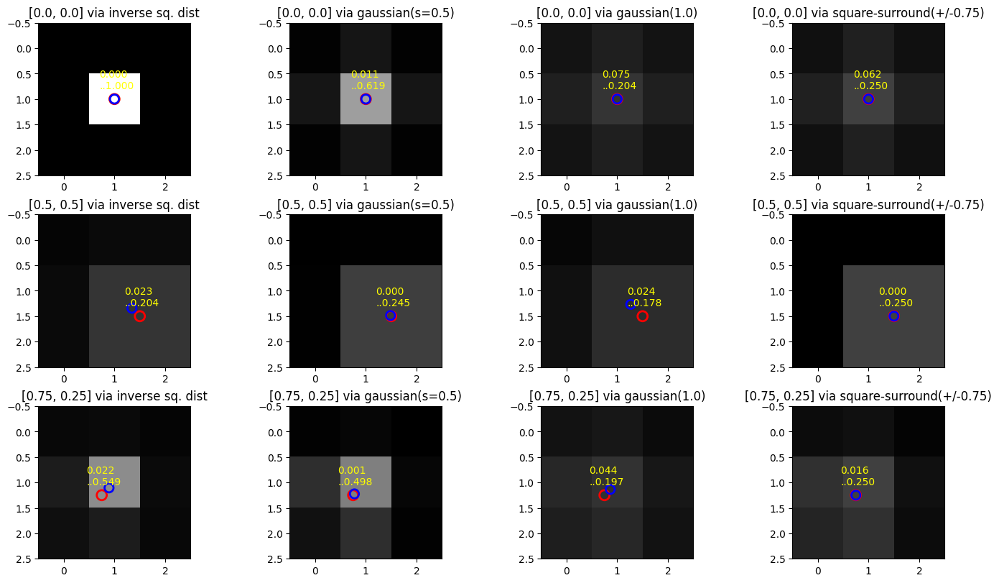

In [7]:
def generate_soft_3x3(x_fp, y_fp, coordinate_radius=1.0):
    """
    Generate a normalized 3x3 kernel centered around (x_fp, y_fp), relative to pixel centers.
    The output weights sum to 1.
    Computes weights as the percentage coverage by a partially enlarged square pixel placed
    exactly onto the floating-point-precision coordinate.

    Note: assumes that pixel integer coordinates are located at the pixel centres.
    This is consistent with OpenCV and matplotlib.

    Args:
      coordinate_radius - must be in range 0.0..1.0. 0.5 = normal pixel size.
        Works best with 1.0.
    """
    def row_coverage(fp):
      row = np.array([-1, 0, +1])
      overlap_left = np.maximum(row - 0.5, fp - coordinate_radius)
      overlap_right = np.minimum(row + 0.5, fp + coordinate_radius)
      overlap = np.clip(overlap_right - overlap_left, 0.0, 1.0)
      return overlap

    # Convert (x_fp, y_fp) to grid coordinate system
    # - assumes grid is placed such that (x_fp,y_fp) is within bounds of central pixel (ie: in range -0.5..+0.5)
    x_fp = x_fp - round(x_fp)
    y_fp = y_fp - round(y_fp)

    # Compute weights
    # - doing x and y axis separately, and then combining into a grid
    dx = row_coverage(x_fp)
    dy = row_coverage(y_fp)
    weights = np.matmul(dy[:, np.newaxis], dx[np.newaxis, :])

    # Normalize weights and return
    weights /= np.sum(weights)
    return weights  # shape (3, 3)

def generate_soft_3x3_other(x_fp, y_fp, method, sigma=None):
    """
    Generate a normalized 3x3 kernel centered around (x_fp, y_fp), relative to pixel centers.
    The output weights sum to 1.

    Note: assumes that pixel integer coordinates are located at the pixel centres.
    This is consistent with OpenCV and matplotlib.

    Neither method perform very well. They require a 5x5 grid at least.

    Args:
      method
      sigma - parameter in method (ignored if inverse-square)
    """
    # Define 3x3 grid coordinate system
    # - places (x_fp,y_fp) within +/- 0.5 of centre of centre pixel @ (0,0)
    dx = np.array([-1, 0, 1])
    dy = np.array([-1, 0, 1])
    x_centers, y_centers = np.meshgrid(dx, dy)  # shape (3, 3)

    # Convert (x_fp, y_fp) to grid coordinate system
    x_fp = x_fp - round(x_fp)
    y_fp = y_fp - round(y_fp)

    # Compute weights
    dist2 = (x_centers - x_fp)**2 + (y_centers - y_fp)**2
    if method == "inverse-dist":
      # weights as squared distance to sub-pixel (0, 0)
      weights = 1.0 / (dist2 + 1e-6)
    elif method == "gaussian":
      # weights as gaussian from distance
      weights = np.exp(-dist2 / (2 * sigma**2))
    else:
      raise ValueError(f"Invalid method: {method}")

    # Normalize weights and return
    weights /= np.sum(weights)
    return weights  # shape (3, 3)

def convert_to_grid_coords(x_fp, y_fp):
    x_fp = x_fp - round(x_fp)
    y_fp = y_fp - round(y_fp)
    return x_fp+1, y_fp+1

def compute_pos(grid_weights):
    dx = np.array([-1, 0, 1])
    dy = np.array([-1, 0, 1])
    x_centers, y_centers = np.meshgrid(dx, dy)  # shape (3, 3)

    x_fp = np.sum(x_centers * grid_weights)
    y_fp = np.sum(y_centers * grid_weights)
    return x_fp+1, y_fp+1

plt.figure(figsize=(14,8), layout='constrained')
coords = [[0.0, 0.0], [0.5,0.5], [0.75, 0.25]]
for i, coord in enumerate(coords):
  x,y = coord
  plt.subplot(len(coords),4,i*4+1)
  grid = generate_soft_3x3_other(x, y, 'inverse-dist')
  pos_pred = compute_pos(grid)
  pos_true = convert_to_grid_coords(x,y)
  plt.title(f"{coord} via inverse sq. dist")
  plt.imshow(grid, vmin=0.0, vmax=1.0, cmap='gray')
  plt.text(pos_true[0]-0.3, pos_true[1]-0.2, f"{np.min(grid):0.3f}\n..{np.max(grid):0.3f}", color='yellow')
  plt.scatter(pos_true[0], pos_true[1], s=100, edgecolors='r', facecolors='none', linewidth=2)
  plt.scatter(pos_pred[0], pos_pred[1], s=80, edgecolors='b', facecolors='none', linewidth=2)

  plt.subplot(len(coords),4,i*4+2)
  grid = generate_soft_3x3_other(x, y, 'gaussian', 0.5)
  pos_pred = compute_pos(grid)
  pos_true = convert_to_grid_coords(x,y)
  plt.title(f"{coord} via gaussian(s=0.5)")
  plt.imshow(grid, vmin=0.0, vmax=1.0, cmap='gray')
  plt.text(pos_true[0]-0.3, pos_true[1]-0.2, f"{np.min(grid):0.3f}\n..{np.max(grid):0.3f}", color='yellow')
  plt.scatter(pos_true[0], pos_true[1], s=100, edgecolors='r', facecolors='none', linewidth=2)
  plt.scatter(pos_pred[0], pos_pred[1], s=80, edgecolors='b', facecolors='none', linewidth=2)

  plt.subplot(len(coords),4,i*4+3)
  grid = generate_soft_3x3_other(x, y, 'gaussian', 1.0)
  pos_pred = compute_pos(grid)
  pos_true = convert_to_grid_coords(x,y)
  plt.title(f"{coord} via gaussian(1.0)")
  plt.imshow(grid, vmin=0.0, vmax=1.0, cmap='gray')
  plt.text(pos_true[0]-0.3, pos_true[1]-0.2, f"{np.min(grid):0.3f}\n..{np.max(grid):0.3f}", color='yellow')
  plt.scatter(pos_true[0], pos_true[1], s=100, edgecolors='r', facecolors='none', linewidth=2)
  plt.scatter(pos_pred[0], pos_pred[1], s=80, edgecolors='b', facecolors='none', linewidth=2)

  plt.subplot(len(coords),4,i*4+4)
  grid = generate_soft_3x3(x, y)
  pos_pred = compute_pos(grid)
  pos_true = convert_to_grid_coords(x,y)
  plt.title(f"{coord} via square-surround(+/-0.75)")
  plt.imshow(grid, vmin=0.0, vmax=1.0, cmap='gray')
  plt.text(pos_true[0]-0.3, pos_true[1]-0.2, f"{np.min(grid):0.3f}\n..{np.max(grid):0.3f}", color='yellow')
  plt.scatter(pos_true[0], pos_true[1], s=100, edgecolors='r', facecolors='none', linewidth=2)
  plt.scatter(pos_pred[0], pos_pred[1], s=80, edgecolors='b', facecolors='none', linewidth=2)
plt.show()

In [8]:
# Random positions (as percentages of image width relative to centre)
corner_coords = tf.random.uniform(shape = (100,2), minval = -0.4, maxval = +0.4)
train_data = tf.data.Dataset.from_tensor_slices(corner_coords)

image shape: (149, 149, 1), val range: 0.0 .. 1.0


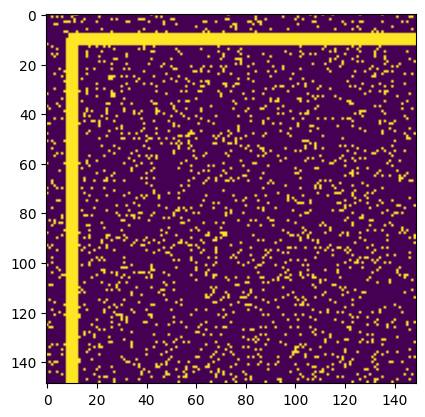

In [9]:
def generate_training_image(x, y):
    img = np.zeros((149, 149), dtype=np.uint8)

    # Add speckled noise
    noise_density = 0.1  # Adjust for more/less speckles
    num_noise_pixels = int(noise_density * img.size)
    xs = np.random.randint(0, 149, num_noise_pixels)
    ys = np.random.randint(0, 149, num_noise_pixels)
    img[ys, xs] = 255

    # Draw vertical line (down from (x, y))
    cv2.line(img, (x, y), (x, 148), 255, thickness=3)

    # Draw horizontal line (right from (x, y))
    cv2.line(img, (x, y), (148, y), 255, thickness=3)

    # Rescale value to 0.0 .. 1.0
    # Add channel dimension for grayscale
    return img[..., np.newaxis] / 255.0

im = generate_training_image(10,10)
print(f"image shape: {np.shape(im)}, val range: {np.min(im)} .. {np.max(im)}")
plt.imshow(im)
plt.show()

image shape: (149, 149, 1), val range: 0.0 .. 0.25


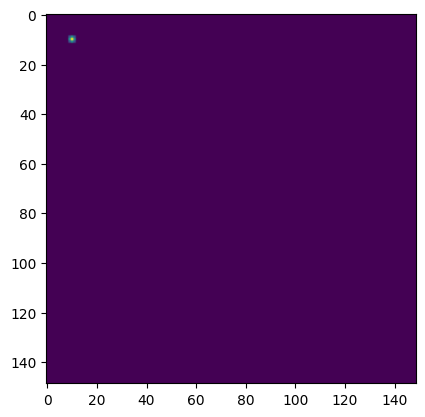

In [10]:
# Generates a heatmap that is mostly zeros, with a 3x3 spot at the target
# coordinate that identifies its exact location to sub-pixel resoultion.
# The weighted sum of the coordinates of the non-zero positions,
# weighted by the heatmap magnitudes, will result in exactly the original coordinate.
def generate_heatmap_image(x, y):
    img = np.zeros((149, 149), dtype=np.float32)
    weights = generate_soft_3x3(x, y)

    xc = int(np.round(x))
    yc = int(np.round(y))

    for dy in range(-1, 2):
        for dx in range(-1, 2):
            xi = xc + dx
            yi = yc + dy
            if 0 <= xi < 149 and 0 <= yi < 149:
                img[yi, xi] = weights[dy + 1, dx + 1]

    return img[..., np.newaxis]

im = generate_heatmap_image(10,10)
print(f"image shape: {np.shape(im)}, val range: {np.min(im)} .. {np.max(im)}")
plt.imshow(im)
plt.show()

In [11]:
def weighted_peak_coordinates(pred, system='unit-scale'):
    """
    Computes the (x,y) coordinates of the peak in a heatmap, taken as the value-weighted
    sum of coordinates in a 3x3 grid surrounding the max value.
    Args:
      predicted heatmaps of shape (B, H, W, C)
    Returns:
      (B, C, 2) tensor of predicted subpixel (x, y) coordinates
    """
    #B, H, W, C = pred.shape[0], pred.shape[1], pred.shape[2], pred.shape[3]
    B, H, W, C = tf.unstack(tf.shape(pred))

    # Prepare input
    # - map to (B, C, H, W) because we're iterating along B & C dimensions,
    #   while selecting into H & W dimensions
    # - pad +/- 1 along H and W dimensions to allow safe 3x3 extraction
    pred = tf.transpose(pred, [0, 3, 1, 2])
    pred = tf.pad(pred, [[0, 0], [0, 0], [1, 1], [1, 1]])

    # Find (x,y) argmax for each channel
    x_peaks = tf.reduce_max(pred, axis=2)                        # (B, W+2, C)
    x_peaks = tf.argmax(x_peaks, axis=-1, output_type=tf.int32)  # (B, C)
    y_peaks = tf.reduce_max(pred, axis=3)                        # (B, H+2, C)
    y_peaks = tf.argmax(y_peaks, axis=-1, output_type=tf.int32)  # (B, C)
    x_peaks = tf.reshape(x_peaks, [B, C, 1])                     # (B, C, 1)
    y_peaks = tf.reshape(y_peaks, [B, C, 1])                     # (B, C, 1)

    # Offsets for 3x3 patch
    dx = tf.constant([-1, 0, 1], tf.int32)
    dy = tf.constant([-1, 0, 1], tf.int32)
    dx, dy = tf.meshgrid(dx, dy)
    dx = tf.reshape(dx, [1, 1, -1])  # (1, 1, 9)
    dy = tf.reshape(dy, [1, 1, -1])  # (1, 1, 9)

    # Compute (x, y) indices for 3x3 patches centered at (x_peaks, y_peaks)
    grid_x_indices = x_peaks + dx  # broadcast to (B, C, 9)
    grid_y_indices = y_peaks + dy  # broadcast to (B, C, 9)
    grid_indices = tf.stack([grid_y_indices, grid_x_indices], axis=-1)  # (B, C, 9, 2)

    # Compute (x, y) coordinates for 3x3 patches centered at (x_peaks, y_peaks)
    # - remove padding
    value_type = pred.dtype
    grid_x_coords = tf.cast(grid_x_indices - 1, value_type)  # (B, C, 9)
    grid_y_coords = tf.cast(grid_y_indices - 1, value_type)  # (B, C, 9)

    # Collect indexed values and normalize as weights
    patch_vals = tf.gather_nd(pred, grid_indices, batch_dims=2)  # (B, C, 9)
    weights = patch_vals / tf.reduce_sum(patch_vals, axis=-1, keepdims=True)

    # Computed value-weighted sum of coordinates
    x_coords = tf.reduce_sum(weights * grid_x_coords, axis=-1)  # (B, C)
    y_coords = tf.reduce_sum(weights * grid_y_coords, axis=-1)  # (B, C)
    coords = tf.stack([x_coords, y_coords], axis=-1)            # (B, C, 2)

    if system == "unit-scale":
      size = tf.cast(tf.reshape(tf.stack([W, H]), [1, 1, 2]), coords.dtype)
      # must be exactly this in order to exactly reverse the 'unit-scale to pixel' conversions used elsewhere
      return (coords - (size // 2)) / size
    elif system == "pixels":
      return coords
    else:
      raise ValueError(f"Invalid coordinate system: {system}")

# batch size = 3, channels = 1 -> pixels
images = tf.stack([generate_heatmap_image(10,10), generate_heatmap_image(10.51,13.2), generate_heatmap_image(29.74,17.432)], axis=0)
coords = weighted_peak_coordinates(images, system='pixels')
print(f"images {images.shape} -> coords #1 {coords.shape}: {coords}")
tf.debugging.assert_near(coords, [[[10.0, 10.0]], [[10.51, 13.2]], [[29.74, 17.432]]])

# batch size = 1, channels = 3 -> pixels
images = tf.stack([generate_heatmap_image(10,10), generate_heatmap_image(10.51,13.2), generate_heatmap_image(29.74,17.432)], axis=-1)
images = tf.reshape(images, [1, 149, 149, -1])
coords = weighted_peak_coordinates(images, system='pixels')
tf.debugging.assert_near(coords, [[[10.0, 10.0], [10.51, 13.2], [29.74, 17.432]]])
print(f"images {images.shape} -> coords #2 {coords.shape}: {coords}")

# batch size = 3, channels = 1 -> unit-scale
images = tf.stack([generate_heatmap_image(10,10), generate_heatmap_image(10.51,13.2), generate_heatmap_image(29.74,17.432)], axis=0)
coords = weighted_peak_coordinates(images, system='unit-scale')
print(f"images {images.shape} -> coords #3 {coords.shape}: {coords}")

images (3, 149, 149, 1) -> coords #1 (3, 1, 2): [[[10.       10.      ]]

 [[10.51     13.2     ]]

 [[29.740002 17.432   ]]]
images (1, 149, 149, 3) -> coords #2 (1, 3, 2): [[[10.       10.      ]
  [10.51     13.2     ]
  [29.740002 17.432   ]]]
images (3, 149, 149, 1) -> coords #3 (3, 1, 2): [[[-0.4295302  -0.4295302 ]]

 [[-0.42610738 -0.4080537 ]]

 [[-0.29704696 -0.379651  ]]]


In [12]:
# doesn't work once trying to train the model
# def to_training_sample(corner_coord):
#   abs_coord = tf.cast(corner_coord * 149 + 149//2, tf.int32)
#   image = tf.py_function(func=lambda coord: generate_training_image(coord[0].numpy(), coord[1].numpy()), inp=[abs_coord], Tout=tf.float32)
#   return image, corner_coord

# dataset = train_data.map(to_training_sample)
# dataset

In [13]:
# Alternative dataset creation if above fails

# image-to-coordinate
def create_dataset(n=1000):
  corner_coords = tf.random.uniform(shape = (n,2), minval = -0.1, maxval = +0.4)
  images = []
  for corner_coord in tqdm.tqdm(corner_coords):
    abs_coord = np.array(corner_coord * 149 + 149//2, dtype=np.int32)
    image = generate_training_image(abs_coord[0], abs_coord[1])
    images.append(tf.constant(image, tf.float32))
  dataset = tf.data.Dataset.from_tensor_slices((images, corner_coords))
  return dataset

train_data = create_dataset(1000)

100%|██████████| 1000/1000 [00:01<00:00, 805.26it/s]


In [14]:
# image-to-image
def create_heatmap_dataset(n=1000):
  corner_coords = tf.random.uniform(shape = (n,2), minval = -0.1, maxval = +0.4)
  inputs = []
  outputs = []
  for corner_coord in tqdm.tqdm(corner_coords):
    abs_coord = np.array(corner_coord * 149 + 149//2, dtype=np.int32)
    input = generate_training_image(abs_coord[0], abs_coord[1])
    output = generate_heatmap_image(abs_coord[0], abs_coord[1])
    inputs.append(tf.constant(input, tf.float32))
    outputs.append(tf.constant(output, tf.float32))
  dataset = tf.data.Dataset.from_tensor_slices((inputs, outputs))
  return dataset

heatmap_train_data = create_heatmap_dataset(1000)

100%|██████████| 1000/1000 [00:01<00:00, 657.14it/s]


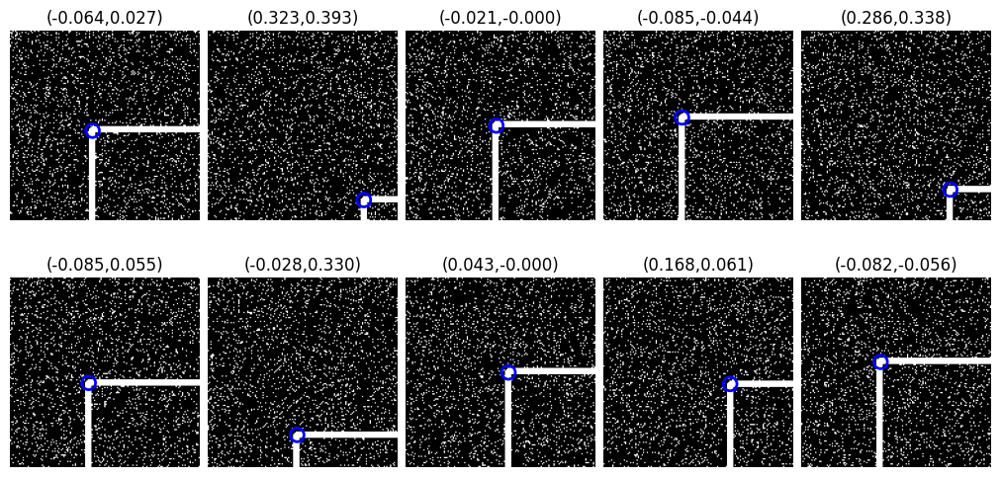

In [15]:
def plot_dataset_entry(image, corner_coords):
  abs_coords = corner_coords * 149 + 149//2
  plt.imshow(image, cmap='gray')
  plt.scatter(abs_coords[0], abs_coords[1], s=100, edgecolors='b', facecolors='none', linewidth=2)
  plt.axis('off')

def plotadd_pred_coord(pred_coords):
  edge_x = -0.5 if pred_coords[0] < -0.5 else +0.5 if pred_coords[0] > 0.5 else None
  edge_y = -0.5 if pred_coords[1] < -0.5 else +0.5 if pred_coords[1] > 0.5 else None

  if edge_x is not None or edge_y is not None:
    if edge_x is not None:
      edge_x = edge_x * 149 + 149//2
      plt.plot([edge_x, edge_x], [0, 148], color='r', linewidth=2)
    if edge_y is not None:
      edge_y = edge_y * 149 + 149//2
      plt.plot([0, 148], [edge_y, edge_y], color='r', linewidth=2)
  else:
    abs_coords = pred_coords * 149 + 149//2
    plt.scatter(abs_coords[0], abs_coords[1], s=80, edgecolors='r', facecolors='none', linewidth=2)
  plt.plot(0, 0, 149, 149, color='r', linewidth=2)


# dynamically copes with image-to-coord and image-to-heatmap datasets
def plot_dataset(dataset, model=None, n=10, show_heatmap=False):
  if show_heatmap:
    cols = min(6,n)
    rows = math.ceil((n*2)/cols)
    plt.figure(figsize=(12,rows*2), layout='constrained')
  else:
    cols = min(5,n)
    rows = math.ceil(n/cols)
    plt.figure(figsize=(10,rows*2.5), layout='constrained')
  taken = dataset.take(n)

  if model is not None:
    predicted = model.predict(taken.map(lambda image, output: image).batch(n))
    if predicted.shape[1:] != (2,):
      predicted_coords = weighted_peak_coordinates(predicted)
      predicted_coords = predicted_coords[:, 0, :]  # remove superfluous C dimension
    else:
      predicted_coords = predicted

    j = 0
    for i, (image, output) in enumerate(taken):
      j += 1
      if output.shape == (2,):
        corner_coords = output
      else:
        corner_coords = weighted_peak_coordinates(tf.expand_dims(output, axis=0))
        corner_coords = corner_coords[0, 0, :]
      pred_coords = predicted_coords[i, ...]

      plt.subplot(rows, cols, j)
      plot_dataset_entry(image, corner_coords)
      plotadd_pred_coord(pred_coords)

      has_heatmap = (predicted[i, ...].shape != (2,))
      if has_heatmap and show_heatmap:
        j += 1
        plt.subplot(rows, cols, j)
        plt.imshow(predicted[i], cmap='gray')
        plt.axis('off')

  else:
    j = 0
    for i, (image, output) in enumerate(taken):
      j += 1
      has_heatmap = False
      if output.shape == (2,):
        corner_coords = output
      else:
        corner_coords = weighted_peak_coordinates(tf.expand_dims(output, axis=0))
        corner_coords = corner_coords[0, 0, :]
        has_heatmap = True

      plt.subplot(rows, cols, j)
      plt.title(f"({corner_coords[0]:.3f},{corner_coords[1]:.3f})")
      plot_dataset_entry(image, corner_coords)

      if has_heatmap and show_heatmap:
        j += 1
        plt.subplot(rows, cols, j)
        plot_dataset_entry(output, corner_coords)
  plt.show()

plot_dataset(train_data)
#plot_dataset(train_data, model)
#plot_dataset(heatmap_train_data, show_heatmap=True)
#plot_dataset(heatmap_train_data, model, show_heatmap=True)

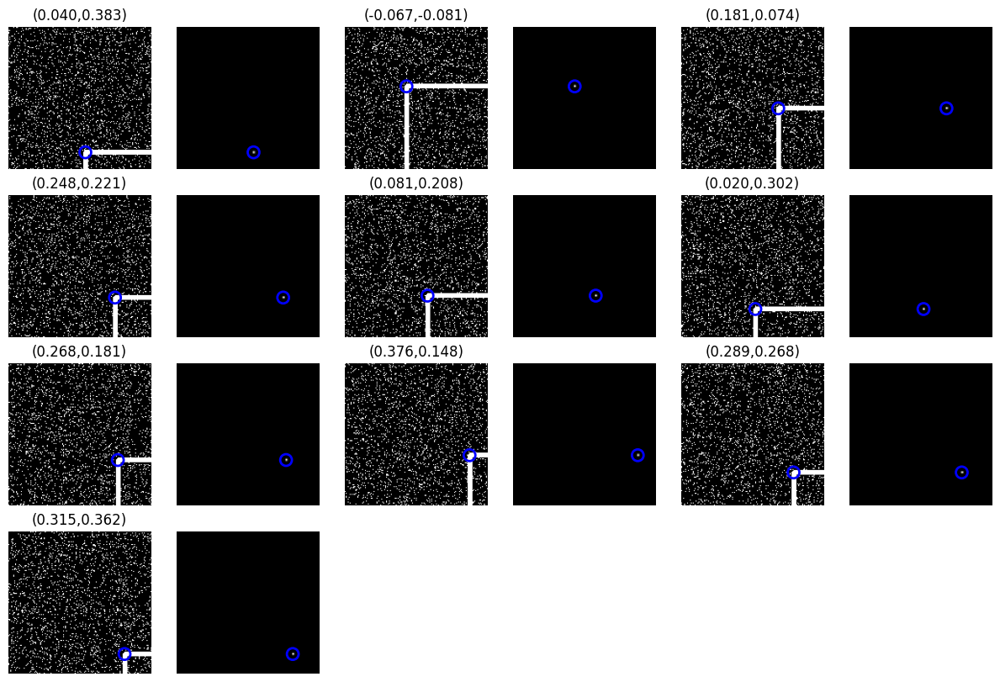

In [16]:
plot_dataset(heatmap_train_data, show_heatmap=True)

## Custom Layers

In [17]:
class HeatmapPeakCoord(layers.Layer):
    """
    Converts from (batch_size, height, width, channels) to (batch_size, channels, 2),
    giving the coordinates of the peak in each channel.
    The peak coordinates are weighted be the values in a 3x3 grid surrounding
    the single max value, for each channel.
    """
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, inputs):
        return weighted_peak_coordinates(inputs, system='unit-scale')

# test using symbolic tensors
input = tf.keras.Input(shape=(149, 149, 3))
out = HeatmapPeakCoord()(input)
print(f"symbolic output: {type(out)}, shape: {out.shape}")

# test using real tensors
input = tf.stack([generate_heatmap_image(10,10), generate_heatmap_image(10.51,13.2), generate_heatmap_image(29.74,17.432)], axis=0)
out = HeatmapPeakCoord()(input)
print(f"actual output: {type(out)}, shape: {out.shape}")

symbolic output: <class 'keras.src.backend.common.keras_tensor.KerasTensor'>, shape: (None, 3, 2)
actual output: <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (3, 1, 2)


symbolic output: <class 'keras.src.backend.common.keras_tensor.KerasTensor'>, shape: (None, 32, 32, 2)
actual output: <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)


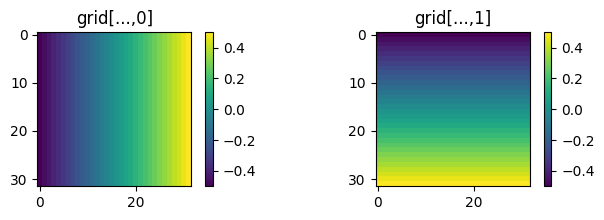

In [18]:
# Based on R. Liu et al., “An Intriguing Failing of CNNs and the CoordConv Solution,” NeurIPS 2018
# https://arxiv.org/abs/1807.03247
class CoordGrid2D(layers.Layer):
    """
    Returns a (batch_size, height, width, 2) tensor with a grid of (x,y) coordinates.
    Generally this will be subsequently concatenated with the input tensor.
    """
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, inputs):
        # inputs.shape => [batch_size, height, width, channels]
        batch_size, height, width, channels = tf.unstack(tf.shape(inputs))

        # Generate a coordinate grid:
        # - x_coords: shape (width,) from -0.5 to 0.5
        # - y_coords: shape (height,) from -0.5 to 0.5
        x_coords = tf.linspace(-0.5, 0.5, width)
        y_coords = tf.linspace(-0.5, 0.5, height)

        # Use meshgrid to get 2D coordinate maps
        # - xx, yy shape => (height, width)
        xx, yy = tf.meshgrid(x_coords, y_coords)

        # Reshape for appending as channels
        xx = tf.expand_dims(xx, axis=-1)  # (height, width, 1)
        yy = tf.expand_dims(yy, axis=-1)  # (height, width, 1)

        # Tile across batch dimension
        xx_tiled = tf.tile(tf.expand_dims(xx, 0), [batch_size, 1, 1, 1])
        yy_tiled = tf.tile(tf.expand_dims(yy, 0), [batch_size, 1, 1, 1])

        # Output as grid with 2-channels
        # output.shape => [batch_size, height, width, 2]
        output = tf.concat([xx_tiled, yy_tiled], axis=-1)
        return output

# demo
input = tf.keras.Input(shape=(32, 32, 3))
cg = CoordGrid2D()(input)
print(f"symbolic output: {type(cg)}, shape: {cg.shape}")

input = tf.zeros((1, 32, 32, 3))
cg = CoordGrid2D()(input)
print(f"actual output: {type(cg)}, shape: {cg.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("grid[...,0]")
plt.imshow(cg[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("grid[...,1]")
plt.imshow(cg[0,:,:,1])
plt.colorbar()
plt.show()

symbolic output: <class 'keras.src.backend.common.keras_tensor.KerasTensor'>, shape: (None, 32, 32, 2)
actual output: <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 33, 32, 2)


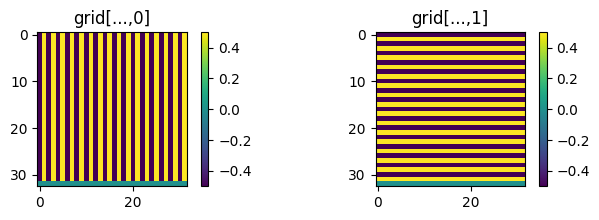

In [19]:
class StrideGrid2D(layers.Layer):
    """
    Returns a (batch_size, height, width, 2) tensor with a grid of (x,y) coordinates.
    Coordinates are aligned to the strides of an assumed subsequent pooling layer,
    and indicate the relative position of the cell in the pool, relative to the
    pool's centre.
    For example, with stride=2, each 2x2 sub-grid has coordinates:
       [[-0.5,-0.5], [+0.5,-0.5]],
        [-0.5,+0.5], [+0.5,+0.5]].

    Generally this will be subsequently concatenated with the input tensor
    before applying a position-wise pooling operation.
    """
    def __init__(self, strides=2, **kwargs):
        super().__init__(**kwargs)
        self.strides = (strides, strides) if np.isscalar(strides) else strides

    def call(self, inputs):
        # inputs.shape => [batch_size, height, width, channels]
        batch_size, height, width, channels = tf.unstack(tf.shape(inputs))

        # Generate a coordinate grid patch:
        # - x_coords: shape (stride_width,) from -0.5 to 0.5
        # - y_coords: shape (stride_height,) from -0.5 to 0.5
        # - xx, yy shape => (stride_height, stride_width)
        # - concatted: (stride_height, stride_width, 2)
        stride_height, stride_width = self.strides
        x_coords = tf.linspace(-0.5, 0.5, stride_width)
        y_coords = tf.linspace(-0.5, 0.5, stride_height)
        xx, yy = tf.meshgrid(x_coords, y_coords)
        grid = tf.concat([tf.expand_dims(xx, axis=-1), tf.expand_dims(yy, axis=-1)], axis=-1)

        # Tile across all patches in image
        # - Tile, then pad if needed
        # - (width, height, 2)
        patch_count_x = width // stride_width
        patch_count_y = height // stride_height
        x_pad = tf.cast(width - patch_count_x * stride_width, tf.int32)
        y_pad = tf.cast(height - patch_count_y * stride_height, tf.int32)
        tiled = tf.tile(grid, [patch_count_x, patch_count_y, 1])
        paddings = tf.stack([
            tf.stack([0, y_pad]),
            tf.stack([0, x_pad]),
            tf.stack([0, 0])
        ])
        tiled = tf.pad(tiled, paddings, 'CONSTANT')

        # Tile across batch dimension
        output = tf.tile(tf.expand_dims(tiled, 0), [batch_size, 1, 1, 1])
        return output

input = tf.keras.Input(shape=(32, 32, 3))
cg = StrideGrid2D()(input)
print(f"symbolic output: {type(cg)}, shape: {cg.shape}")

input = tf.zeros((1, 33, 32, 3))
cg = StrideGrid2D(strides=2)(input)
print(f"actual output: {type(cg)}, shape: {cg.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("grid[...,0]")
plt.imshow(cg[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("grid[...,1]")
plt.imshow(cg[0,:,:,1])
plt.colorbar()
plt.show()

actual output (cg): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)
actual output (mp): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 16, 16, 2)


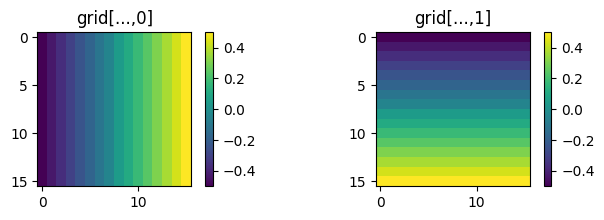

In [20]:
class PositionwiseMaxPool2D(tf.keras.layers.Layer):
    """
    Pooling operation that selects all channels from the same position as a single unit.
    Positions are chosen by arg-max over a reduction operation (sum-of-squares).
    Use channel_weights to exclude some channels from the reduction.
    """

    def __init__(self, pool_size=(2, 2), strides=None, channel_weights=None, **kwargs):
        super().__init__(**kwargs)

        self.pool_size = (pool_size, pool_size) if np.isscalar(pool_size) else pool_size
        if strides is None:
          self.strides = self.pool_size
        else:
          self.strides = (strides, strides) if np.isscalar(strides) else strides
        self.channel_weights = channel_weights

    def call(self, inputs):
        batch_size, height, width, channels = tf.unstack(tf.shape(inputs))
        ksize = self.pool_size
        strides = self.strides

        # Extract 2x2 patches: shape (B, H//2, W//2, 2, 2, C)
        patches = tf.image.extract_patches(
            images=inputs,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, strides[0], strides[1], 1],
            rates=[1, 1, 1, 1],
            padding='VALID'
        )
        patch_shape = tf.shape(patches)
        out_h, out_w = patch_shape[1], patch_shape[2]

        # Reshape to (B, out_h, out_w, 4, C)
        patches = tf.reshape(patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])

        # Compute reduction: (B, out_h, out_w, 4)
        # - using sum-of-squares, which is equivalent to a norm() once argmax is applied
        if self.channel_weights is None:
          norms = tf.reduce_sum(tf.square(patches), axis=-1)
        else:
          norms = tf.reduce_sum(tf.square(patches) * self.channel_weights, axis=-1)

        # Argmax to find winning positions: (B, out_h, out_w)
        indices = tf.argmax(norms, axis=-1, output_type=tf.int32)

        # Gather the full vectors corresponding to max-norm positions
        one_hot = tf.one_hot(indices, depth=ksize[0]*ksize[1])  # shape: (B, out_h, out_w, 4)
        one_hot = tf.expand_dims(one_hot, axis=-1)              # shape: (B, out_h, out_w, 4, 1)
        output = tf.reduce_sum(one_hot * patches, axis=-2)      # shape: (B, out_h, out_w, C)

        return output

input = tf.zeros((1, 32, 32, 3))
cg = CoordGrid2D()(input)
#cg = StrideGrid2D()(input)
mp = PositionwiseMaxPool2D()(cg)
print(f"actual output (cg): {type(cg)}, shape: {cg.shape}")
print(f"actual output (mp): {type(mp)}, shape: {mp.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("grid[...,0]")
plt.imshow(mp[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("grid[...,1]")
plt.imshow(mp[0,:,:,1])
plt.colorbar()
plt.show()

In [21]:
# PositionwiseMaxPool2D tests

# Combining coord grid with channel_mask
input = tf.constant([[
    [[0.5, 0.5, 0.3], [0.1, 0.2, 0.3], [0.5, 0.3, 0.5], [0.7, 0.8, 0.9]],
    [[0.4, 0.3, 0.5], [0.3, 0.3, 0.3], [0.4, 0.3, 0.5], [0.3, 0.3, 0.3]],
    [[0.1, 0.2, 0.3], [0.0, 0.0, 0.3], [0.3, 0.5, 0.5], [0.6, 0.6, 0.7]],
    [[0.2, 0.3, 0.2], [0.0, 0.0, 0.3], [0.4, 0.3, 0.5], [0.5, 0.6, 0.5]]
]])
expected1 = tf.constant([[
    [[0.5, 0.5, 0.3, -0.5, -0.5], [0.7, 0.8, 0.9, +0.5, -0.5]],
    [[0.2, 0.3, 0.2, -0.5, +0.5], [0.6, 0.6, 0.7, +0.5, 1/6.]]
]])
coords = CoordGrid2D()(input)
x = layers.Concatenate()([input, coords])
x = PositionwiseMaxPool2D(channel_weights=[1, 1, 1, 0, 0])(x)
assert np.allclose(x.numpy(), expected1.numpy())

# Combining stride grid with channel_mask
expected2 = tf.constant([[
    [[0.4, 0.3, 0.5, -0.5, +0.5], [0.7, 0.8, 0.9, +0.5, -0.5]],
    [[0.1, 0.2, 0.3, -0.5, -0.5], [0.6, 0.6, 0.7, +0.5, -0.5]],
]])
coords = StrideGrid2D()(input)
x = layers.Concatenate()([input, coords])
x = PositionwiseMaxPool2D(channel_weights=[0, 0, 1, 0, 0])(x)
assert np.allclose(x.numpy(), expected2.numpy())

In [22]:
# Suggested by ChatGPT
# - This variant treats the entire image as heatmaps, one heatmap for each channel.
# - And identifies a single centre point.
# - Nice on the face of it, but not clear how to pass the spatial results down through further down-scaling blocks.
# TODO could turn into complete layer
def spatial_softmax(activations):
    # activations: (B, H, W, C)
    shape = tf.shape(activations)
    B, H, W, C = shape[0], shape[1], shape[2], shape[3]

    # Reshape to (B, H*W, C)
    flat = tf.reshape(activations, [B, H * W, C])
    softmax = tf.nn.softmax(flat, axis=1)

    # Create coordinate grid
    x_coords = tf.linspace(-1.0, 1.0, W)
    y_coords = tf.linspace(-1.0, 1.0, H)
    x_grid, y_grid = tf.meshgrid(x_coords, y_coords)
    x_grid = tf.reshape(x_grid, [-1])
    y_grid = tf.reshape(y_grid, [-1])

    # Multiply and sum: expected x and y
    expected_x = tf.reduce_sum(softmax * x_grid[tf.newaxis, :, tf.newaxis], axis=1)
    expected_y = tf.reduce_sum(softmax * y_grid[tf.newaxis, :, tf.newaxis], axis=1)

    # Output shape: (B, 2*C)
    return tf.concat([expected_x, expected_y], axis=-1)


symbolic output: <class 'keras.src.backend.common.keras_tensor.KerasTensor'>, shape: (None, 32, 32, 2)
actual output (cg): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)
actual output (mp): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 16, 16, 2)


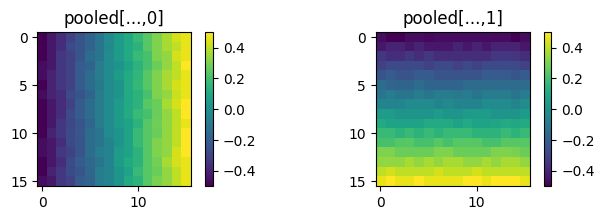

In [23]:
class AttentionPool2D(tf.keras.layers.Layer):
    """
    2D downsampling layer that computes a soft-argmax from one input
    to attend to the second input.
    Typically used for softmax-weighted pooling of positional inputs, based
    on the strength of the feature vectors.

    Both inputs must have the same shape (B, H, W, C). Operates channel-wise.
    Channels from each input are paired up, in sequence.

    Output shape: (B, pooled_H, pooled_w, C).
    """

    def __init__(self, pool_size=(2, 2), strides=None, padding='valid', **kwargs):
        super().__init__(**kwargs)

        self.pool_size = (pool_size, pool_size) if np.isscalar(pool_size) else pool_size
        if strides is None:
          self.strides = self.pool_size
        else:
          self.strides = (strides, strides) if np.isscalar(strides) else strides
        self.padding = padding.upper()

    def call(self, keys, values):
        batch_size, height, width, channels = tf.unstack(tf.shape(keys))
        tf.assert_equal(tf.shape(keys), tf.shape(values), "Input tensors must have identical shape", summarize=4)
        ksize = self.pool_size

        # Extract pool patches, eg: (assuming 2x2) (B, H//2, W//2, 2, 2, C)
        key_patches = tf.image.extract_patches(
            images=keys,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        value_patches = tf.image.extract_patches(
            images=values,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        patch_shape = tf.shape(key_patches)
        out_h, out_w = patch_shape[1], patch_shape[2]

        # Reshape to (B, out_h, out_w, 4, C)
        key_patches   = tf.reshape(key_patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])
        value_patches = tf.reshape(value_patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])

        # Compute softmax-weighted mean of values, shape: (B, out_h, out_w, C)
        attention_scores = tf.nn.softmax(key_patches, axis=-2)
        output = tf.reduce_sum(attention_scores * value_patches, axis=-2)
        return output

# check with symbolic tensors
input = tf.keras.Input(shape=(32, 32, 3))
features = StrideGrid2D()(input)
cg = CoordGrid2D()(input)
mp = AttentionPool2D()(features, cg)
print(f"symbolic output: {type(cg)}, shape: {cg.shape}")

# check with concrete values
input = tf.zeros((1, 32, 32, 3))
cg = CoordGrid2D()(input)
features = tf.random.normal(shape=(1, 32, 32, 2)) * 50
mp = AttentionPool2D()(features, cg)
print(f"actual output (cg): {type(cg)}, shape: {cg.shape}")
print(f"actual output (mp): {type(mp)}, shape: {mp.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("pooled[...,0]")
plt.imshow(mp[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("pooled[...,1]")
plt.imshow(mp[0,:,:,1])
plt.colorbar()
plt.show()

symbolic output: <class 'keras.src.backend.common.keras_tensor.KerasTensor'>, shape: (None, 32, 32, 2)
actual output (features): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)


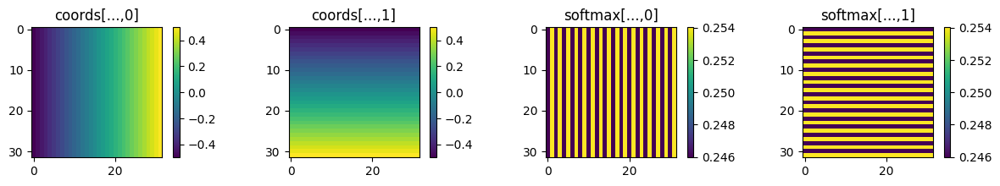

actual output (cg): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)
actual output (mp): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 16, 16, 2)


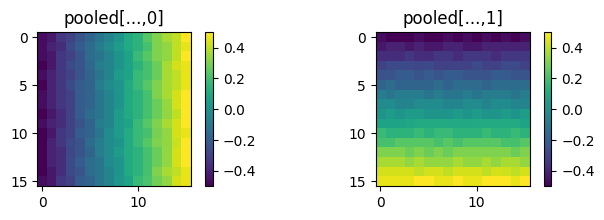

In [24]:
# Breaks out the steps of AttentionPool2D for easier interpretability.
class StridedSoftmax2D(tf.keras.layers.Layer):
    """
    Applies softmax to values within stride-patches, channel-wise.
    """

    def __init__(self, pool_size=(2, 2), strides=None, **kwargs):
        super().__init__(**kwargs)

        self.pool_size = (pool_size, pool_size) if np.isscalar(pool_size) else pool_size
        if strides is None:
          self.strides = self.pool_size
        else:
          self.strides = (strides, strides) if np.isscalar(strides) else strides
        self.padding = 'valid'.upper()  # can only do if using 'valid' padding

        if self.pool_size != self.strides:
            raise ValueError("pool_size and strides must be the same")

    def call(self, input):
        batch_size, height, width, channels = tf.unstack(tf.shape(input))
        ksize = self.pool_size

        # Extract pool patches, eg: (assuming 2x2) (B, H//2, W//2, 2, 2, C)
        # Then reshape to (B, out_h, out_w, 4, C)
        patches = tf.image.extract_patches(
            images=input,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        patch_shape = tf.shape(patches)
        out_h, out_w = patch_shape[1], patch_shape[2]
        patches = tf.reshape(patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])

        # Compute softmax
        # Then reshape back to original (B, H, W, C)
        # Compute softmax-weighted mean of values, shape: (B, out_h, out_w, C)
        patches = tf.nn.softmax(patches, axis=-2)

        # Convert back to original shape
        # - only possible when strides=pool_size and padding=valid
        output = tf.reshape(patches, [batch_size, out_h, out_w, ksize[0], ksize[1], channels])
        output = tf.transpose(output, [0, 1, 3, 2, 4, 5])  # eg: (B, H//2, 2, W//2, 2, C)
        output = tf.reshape(output, [batch_size, height, width, channels])

        return output

class DotPool2D(tf.keras.layers.Layer):
    """
    2D downsampling layer that combines the values between two inputs via a flattened dot-product
    applied patch-wise and channel-wise. Wordedly differently, it applies a weighted sum,
    where the first input provides the weights and the second input provides the values.
    However, you could equally phrase them the other way around.

    Both inputs must have the same shape (B, H, W, C). Operates channel-wise.
    Channels from each input are paired up, in sequence.

    Output shape: (B, pooled_H, pooled_w, C).
    """

    def __init__(self, pool_size=(2, 2), strides=None, padding='valid', **kwargs):
        super().__init__(**kwargs)

        self.pool_size = (pool_size, pool_size) if np.isscalar(pool_size) else pool_size
        if strides is None:
          self.strides = self.pool_size
        else:
          self.strides = (strides, strides) if np.isscalar(strides) else strides
        self.padding = padding.upper()

    def call(self, keys, values):
        batch_size, height, width, channels = tf.unstack(tf.shape(keys))
        tf.assert_equal(tf.shape(keys), tf.shape(values), "Input tensors must have identical shape", summarize=4)
        ksize = self.pool_size

        # Extract pool patches, eg: (assuming 2x2) (B, H//2, W//2, 2, 2, C)
        key_patches = tf.image.extract_patches(
            images=keys,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        value_patches = tf.image.extract_patches(
            images=values,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        patch_shape = tf.shape(key_patches)
        out_h, out_w = patch_shape[1], patch_shape[2]

        # Reshape to (B, out_h, out_w, 4, C)
        key_patches   = tf.reshape(key_patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])
        value_patches = tf.reshape(value_patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])

        # Compute dotted sum of values, shape: (B, out_h, out_w, C)
        output = tf.reduce_sum(key_patches * value_patches, axis=-2)
        return output

# check with symbolic tensors
input = tf.keras.Input(shape=(32, 32, 3))
features = StrideGrid2D()(input)
cg = CoordGrid2D()(input)
features = StridedSoftmax2D()(features)
mp = DotPool2D()(features, cg)
print(f"symbolic output: {type(cg)}, shape: {cg.shape}")

# check with concrete values
input = tf.zeros((1, 32, 32, 3))
#features = tf.random.normal(shape=(1, 32, 32, 2)) * 50
coords = CoordGrid2D()(input)
features = StridedSoftmax2D()(coords)
print(f"actual output (features): {type(features)}, shape: {features.shape}")

plt.figure(figsize=(15,2))
plt.subplot(1,4,1)
plt.title("coords[...,0]")
plt.imshow(coords[0,:,:,0])
plt.colorbar()

plt.subplot(1,4,2)
plt.title("coords[...,1]")
plt.imshow(coords[0,:,:,1])
plt.colorbar()

plt.subplot(1,4,3)
plt.title("softmax[...,0]")
plt.imshow(features[0,:,:,0])
plt.colorbar()

plt.subplot(1,4,4)
plt.title("softmax[...,1]")
plt.imshow(features[0,:,:,1])
plt.colorbar()
plt.show()

# check with concrete values
input = tf.zeros((1, 32, 32, 3))
cg = CoordGrid2D()(input)
features = tf.random.normal(shape=(1, 32, 32, 2)) * 50
features = StridedSoftmax2D()(features)
mp = DotPool2D()(features, cg)
print(f"actual output (cg): {type(cg)}, shape: {cg.shape}")
print(f"actual output (mp): {type(mp)}, shape: {mp.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("pooled[...,0]")
plt.imshow(mp[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("pooled[...,1]")
plt.imshow(mp[0,:,:,1])
plt.colorbar()
plt.show()

In [25]:
input = tf.zeros((1, 4, 4, 3))
input = CoordGrid2D()(input)
print(f"input: {input.shape}")
#input = input[...,0]
#input = input[...,np.newaxis]
batch_size, height, width, channels = tf.unstack(tf.shape(input))

patches = tf.image.extract_patches(
    images=input,
    sizes=[1, 2, 2, 1],
    strides=[1, 2, 2, 1],
    rates=[1, 1, 1, 1],
    padding='VALID'
)  # (B, H//2, W//2, 2*2*C)
print(f"patches: {patches.shape}")
patches_orig = patches
patch_shape = tf.shape(patches)
out_h, out_w = patch_shape[1], patch_shape[2]
patches = tf.reshape(patches, [batch_size, out_h, out_w, 2*2, channels])
patches_reshaped = patches
print(f"patches: {patches.shape}")

patches = tf.nn.softmax(patches, axis=-2)

output = tf.reshape(patches, [batch_size, out_h, out_w, 2, 2, channels])
output = tf.transpose(output, [0, 1, 3, 2, 4, 5])  # eg: (B, H//2, 2, W//2, 2, C)
output = tf.reshape(output, [batch_size, height, width, channels])


input: (1, 4, 4, 2)
patches: (1, 2, 2, 8)
patches: (1, 2, 2, 4, 2)


In [26]:
print(f"input[0]:              {input.shape} =\n{input[0, :, :, 0]}")
print(f"patches_orig:          {patches_orig.shape}")
print(f"patches_reshaped[0]:   {patches_reshaped.shape} =\n{patches_reshaped[0, :, :, :, 0]}")
print(f"patches (softmax)[0]:  {patches.shape} =\n{patches[0, :, :, :, 0]}")

input[0]:              (1, 4, 4, 2) =
[[-0.5        -0.16666666  0.16666669  0.5       ]
 [-0.5        -0.16666666  0.16666669  0.5       ]
 [-0.5        -0.16666666  0.16666669  0.5       ]
 [-0.5        -0.16666666  0.16666669  0.5       ]]
patches_orig:          (1, 2, 2, 8)
patches_reshaped[0]:   (1, 2, 2, 4, 2) =
[[[-0.5        -0.16666666 -0.5        -0.16666666]
  [ 0.16666669  0.5         0.16666669  0.5       ]]

 [[-0.5        -0.16666666 -0.5        -0.16666666]
  [ 0.16666669  0.5         0.16666669  0.5       ]]]
patches (softmax)[0]:  (1, 2, 2, 4, 2) =
[[[0.2087149 0.2912851 0.2087149 0.2912851]
  [0.2087149 0.2912851 0.2087149 0.2912851]]

 [[0.2087149 0.2912851 0.2087149 0.2912851]
  [0.2087149 0.2912851 0.2087149 0.2912851]]]


## Models
Now we'll create a series of models with different techniques, so we can compare.

### Baseline Model
The baseline is a vanilla regression CNN that makes no attempt at customising to support spatial information.

In [ ]:
# Check one-hot-encoding theory, but not that this model has 2 conv layers per block, so probably does have compression.
calculate_onehotencoding_theory(strides=2, blocks=7, max_channels=128)

Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  16,384
  Effective resolution at 128 channels (in blocks):        3.5
  Effective resolution at 128 channels (in pixels):        13.169863799599447


In [104]:
def baseline_model(min_filters=4, max_filters=4096, batch_norm=False, dropout=None):
  def downscale(filters, inp):
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(inp)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    if batch_norm:
      x = layers.BatchNormalization()(x)
    if dropout is not None:
      x = layers.Dropout(dropout)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  # 149x149x1 -> 1x1x2
  filters = min_filters
  x = downscale(min(filters*1, max_filters), x)   # 74x74x4
  x = downscale(min(filters*2, max_filters), x)   # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x)  # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

baseline_model().summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 149, 149, 4)    │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 149, 149, 4)    │           148 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 74, 74, 8)      │           296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 74, 74, 8)      │           584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 37, 37, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 18, 18, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 18, 18, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 9, 9, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 4, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 4, 4, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 2, 2, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 2, 2, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 590,734 (2.25 MB)

 Trainable params: 590,734 (2.25 MB)

 Non-trainable params: 0 (0.00 B)

In [106]:
#dataset = train_data.map(to_training_sample).prefetch(True).batch(32)

# Baseline model
dataset = train_data.batch(32)
model = baseline_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
#history = model.fit(dataset, epochs=10)
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 2.47s/epoch: loss: 0.0006  mae: 0.0192  
Epoch    10 - 360.65ms/epoch: loss: 0.0004  mae: 0.0166  
Epoch    15 - 355.63ms/epoch: loss: 0.0002  mae: 0.0100  
Epoch    20 - 360.78ms/epoch: loss: 0.0003  mae: 0.0143  
Epoch    25 - 358.37ms/epoch: loss: 0.0003  mae: 0.0147  
Epoch    30 - 372.49ms/epoch: loss: 0.0001  mae: 0.0099  
Epoch    35 - 420.84ms/epoch: loss: 0.0004  mae: 0.0157  
Epoch    40 - 358.63ms/epoch: loss: 0.0001  mae: 0.0068  
Epoch    45 - 359.22ms/epoch: loss: 0.0000  mae: 0.0046  
Epoch    50 - 360.53ms/epoch: loss: 0.0001  mae: 0.0071  
Total training time: 28.9 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step
pred.x: -0.11793530732393265..0.4021591246128082
pred.y: -0.11131834238767624..0.4092855751514435


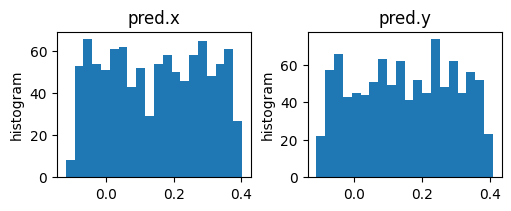

In [ ]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


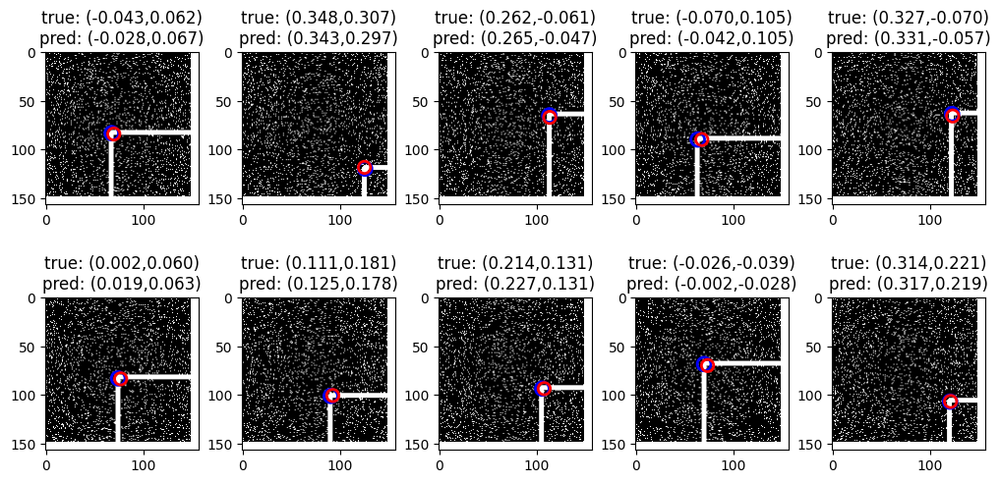

In [107]:
plot_dataset(train_data, model)

### Fully-Convolutional model
For a first simple comparison to the baseline model. Here's a so called "Fully Convolutional" model that stays at full resolution and then uses global pooling to convert to the regression output.


In [ ]:
# Fully-Convolutional model
def fullconv_model(reduction='mean', max_filters=128):
  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  x = layers.Conv2D(min(128, max_filters), kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
  x = layers.MaxPooling2D(pool_size=2)(x)   # 74x74x128
  x = layers.Conv2D(min(128, max_filters), kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
  x = layers.MaxPooling2D(pool_size=2)(x)   # 74x74x128
  x = layers.Conv2D(min(128, max_filters), kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
  if reduction == 'max':
    x = layers.GlobalMaxPool2D()(x)         # 128
  elif reduction == 'mean':
    x = layers.GlobalAveragePooling2D()(x)  # 128
  else:
    raise ValueError(f"Invalid reduction '{reduction}'")
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

fullconv_model().summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_99 (Conv2D)              │ (None, 149, 149, 128)  │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 74, 74, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_100 (Conv2D)             │ (None, 74, 74, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_101 (Conv2D)             │ (None, 37, 37, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 296,706 (1.13 MB)

 Trainable params: 296,706 (1.13 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = fullconv_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 3.66s/epoch: loss: 0.0215  mae: 0.1271  
Epoch    10 - 1.77s/epoch: loss: 0.0214  mae: 0.1267  
Epoch    15 - 1.95s/epoch: loss: 0.0201  mae: 0.1225  
Epoch    20 - 1.79s/epoch: loss: 0.0031  mae: 0.0434  
Epoch    25 - 1.94s/epoch: loss: 0.0001  mae: 0.0068  
Epoch    30 - 1.78s/epoch: loss: 0.0001  mae: 0.0062  
Epoch    35 - 1.74s/epoch: loss: 0.0001  mae: 0.0059  
Epoch    40 - 1.78s/epoch: loss: 0.0001  mae: 0.0058  
Epoch    45 - 1.91s/epoch: loss: 0.0001  mae: 0.0054  
Epoch    50 - 1.80s/epoch: loss: 0.0000  mae: 0.0049  
Total training time: 100.6 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step
pred.x: -0.10234498977661133..0.4022652208805084
pred.y: -0.08966237306594849..0.4153406620025635


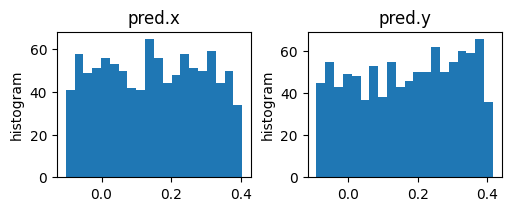

In [ ]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


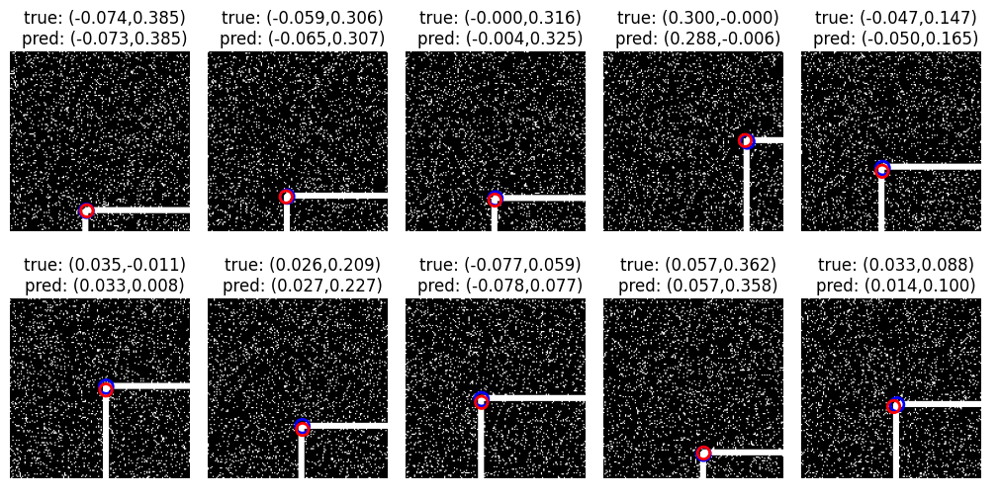

In [ ]:
plot_dataset(train_data, model)

### Chat GPT Models
For more "baseline-like" comparisons, here's the model proposed by Chat GPT. The first one is the direct suggestion by Chat GPT, which stops its downscalling after only a couple of blocks and then uses a Dense layer for regression. This is a weird half-way house, so don't great because I want to understand the pros/cons of the fundamental architectural styles.

A second variant takes the same architecture to its logical extension after downscaling to the regression output shape.

In [ ]:
# Chat GPT model
def chatgpt_model():
    inputs = tf.keras.Input(shape=(149, 149, 1))
    x = tf.keras.layers.Conv2D(32, kernel_size=3, activation='relu')(inputs)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 73x73x32
    x = tf.keras.layers.Conv2D(64, kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 35x35x64
    x = tf.keras.layers.Flatten()(x)                  # (35*35*64)
    x = tf.keras.layers.Dense(64, activation='relu')(x)  # 64
    outputs = tf.keras.layers.Dense(2)(x)  # Linear activation for regression
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

chatgpt_model().summary()

Model: "functional_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_54 (InputLayer)     │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_177 (Conv2D)             │ (None, 147, 147, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_64 (MaxPooling2D) │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_178 (Conv2D)             │ (None, 71, 71, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_65 (MaxPooling2D) │ (None, 35, 35, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_32 (Flatten)            │ (None, 78400)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 64)             │     5,017,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,036,610 (19.21 MB)

 Trainable params: 5,036,610 (19.21 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = chatgpt_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.19s/epoch: loss: 0.0042  mae: 0.0526  
Epoch    10 - 498.80ms/epoch: loss: 0.0150  mae: 0.1004  
Epoch    15 - 493.68ms/epoch: loss: 0.0018  mae: 0.0343  
Epoch    20 - 554.35ms/epoch: loss: 0.0095  mae: 0.0836  
Epoch    25 - 529.00ms/epoch: loss: 0.0004  mae: 0.0153  
Epoch    30 - 504.59ms/epoch: loss: 0.0001  mae: 0.0075  
Epoch    35 - 498.00ms/epoch: loss: 0.0001  mae: 0.0050  
Epoch    40 - 499.45ms/epoch: loss: 0.0001  mae: 0.0044  
Epoch    45 - 534.91ms/epoch: loss: 0.0001  mae: 0.0044  
Epoch    50 - 530.55ms/epoch: loss: 0.0001  mae: 0.0046  
Total training time: 29.2 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
pred.x: -0.11071040481328964..0.39714524149894714
pred.y: -0.13155904412269592..0.3883061707019806


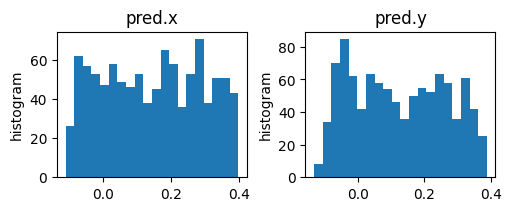

In [ ]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


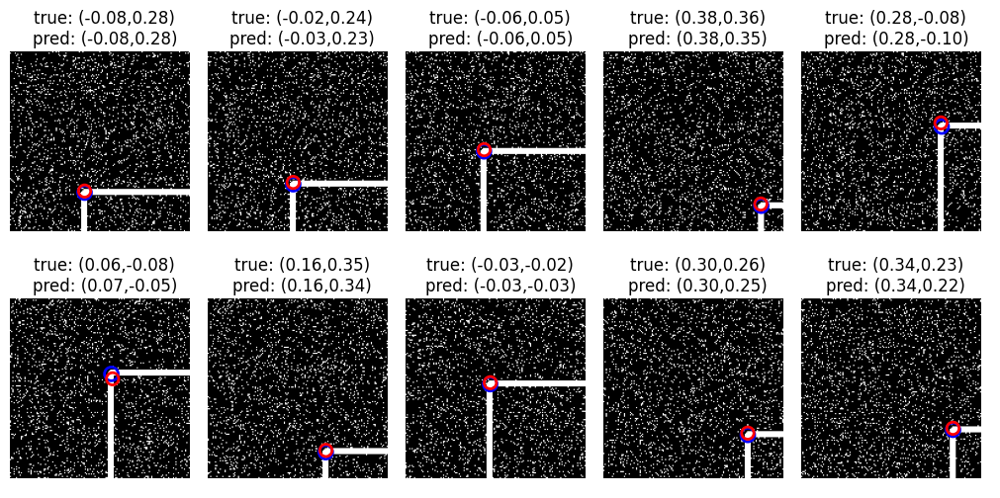

In [ ]:
plot_dataset(train_data, model)

In [ ]:
# Logical extension of Chat GPT model
def extreme_chatgpt_model(min_filters=32, max_filters=4096):
    inputs = tf.keras.Input(shape=(149, 149, 1))
    filters=min_filters
    x = tf.keras.layers.Conv2D(min(filters*1, max_filters), kernel_size=3, activation='relu')(inputs)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 73x73x32
    x = tf.keras.layers.Conv2D(min(filters*2, max_filters), kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 35x35x64
    x = tf.keras.layers.Conv2D(min(filters*4, max_filters), kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 16x16x128
    x = tf.keras.layers.Conv2D(min(filters*8, max_filters), kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 7x7x256
    x = tf.keras.layers.Conv2D(min(filters*16, max_filters), kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 2x2x512
    x = tf.keras.layers.Conv2D(min(filters*16, max_filters), kernel_size=3, padding='same', activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 1x1x512
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(min(64, max_filters), activation='relu')(x)
    outputs = tf.keras.layers.Dense(2)(x)  # Linear activation for regression
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

extreme_chatgpt_model().summary()
print()
calculate_onehotencoding_theory(strides=2, blocks=6, max_channels=512)
calculate_onehotencoding_theory(strides=2, blocks=6, max_channels=16)

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 147, 147, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_37 (MaxPooling2D) │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_45 (Conv2D)              │ (None, 71, 71, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_38 (MaxPooling2D) │ (None, 35, 35, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 33, 33, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_39 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_47 (Conv2D)              │ (None, 14, 14, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_40 (MaxPooling2D) │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_48 (Conv2D)              │ (None, 5, 5, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_41 (MaxPooling2D) │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_49 (Conv2D)              │ (None, 2, 2, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 1, 1, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,960,770 (15.11 MB)

 Trainable params: 3,960,770 (15.11 MB)

 Non-trainable params: 0 (0.00 B)


Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  4,096
  Effective resolution at 512 channels (in blocks):        4.5
  Effective resolution at 512 channels (in pixels):        6.584931899799724
Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  4,096
  Effective resolution at 16 channels (in blocks):        2.0
  Effective resolution at 16 channels (in pixels):        37.25


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 2.00s/epoch: loss: 0.0052  mae: 0.0418  
Epoch    10 - 820.93ms/epoch: loss: 0.0038  mae: 0.0327  
Epoch    15 - 912.50ms/epoch: loss: 0.0012  mae: 0.0226  
Epoch    20 - 841.00ms/epoch: loss: 0.0004  mae: 0.0134  
Epoch    25 - 833.06ms/epoch: loss: 0.0004  mae: 0.0147  
Epoch    30 - 829.35ms/epoch: loss: 0.0002  mae: 0.0100  
Epoch    35 - 1.00s/epoch: loss: 0.0002  mae: 0.0093  
Epoch    40 - 820.83ms/epoch: loss: 0.0001  mae: 0.0069  
Epoch    45 - 834.99ms/epoch: loss: 0.0001  mae: 0.0064  
Epoch    50 - 825.73ms/epoch: loss: 0.0001  mae: 0.0081  
Total training time: 48.6 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step
pred.x: -0.09744839370250702..0.39086392521858215
pred.y: -0.09820431470870972..0.38109904527664185


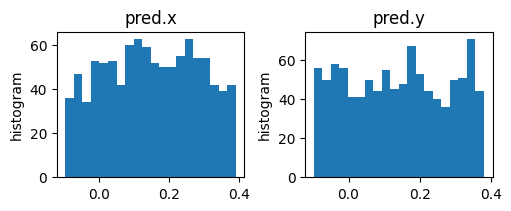

In [ ]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


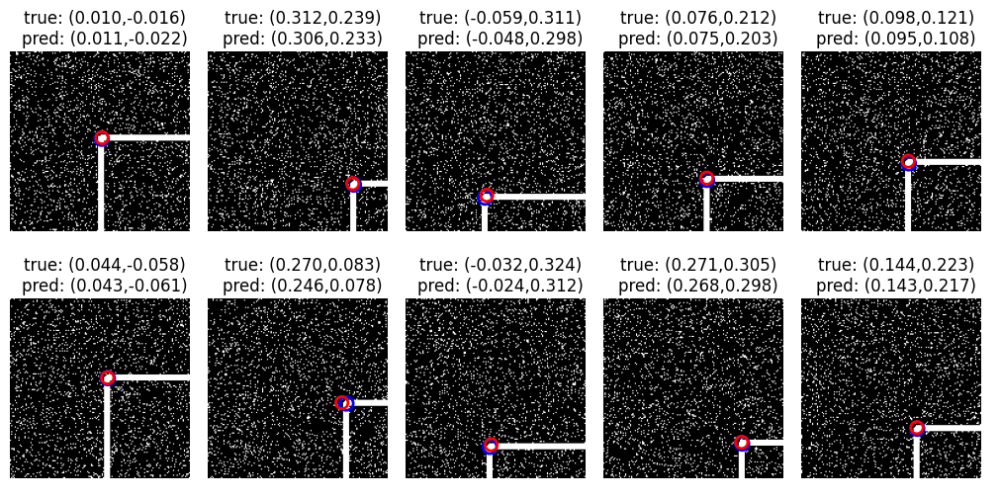

In [ ]:
plot_dataset(train_data, model)

In [ ]:
# extended chat-gpt model with only 16 filters
extreme_chatgpt_model(max_filters=16).summary()
print()
calculate_onehotencoding_theory(strides=2, blocks=6, max_channels=16)

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_62 (Conv2D)              │ (None, 147, 147, 16)   │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_55 (MaxPooling2D) │ (None, 73, 73, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_63 (Conv2D)              │ (None, 71, 71, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (None, 35, 35, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_64 (Conv2D)              │ (None, 33, 33, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_57 (MaxPooling2D) │ (None, 16, 16, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_65 (Conv2D)              │ (None, 14, 14, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_58 (MaxPooling2D) │ (None, 7, 7, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_66 (Conv2D)              │ (None, 5, 5, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_59 (MaxPooling2D) │ (None, 2, 2, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_67 (Conv2D)              │ (None, 2, 2, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_60 (MaxPooling2D) │ (None, 1, 1, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,066 (47.13 KB)

 Trainable params: 12,066 (47.13 KB)

 Non-trainable params: 0 (0.00 B)


Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  4,096
  Effective resolution at 16 channels (in blocks):        2.0
  Effective resolution at 16 channels (in pixels):        37.25


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=16)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
#history = model.fit(dataset, epochs=1)
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.69s/epoch: loss: 0.0194  mae: 0.1195  
Epoch    10 - 272.53ms/epoch: loss: 0.0050  mae: 0.0426  
Epoch    15 - 271.86ms/epoch: loss: 0.0038  mae: 0.0357  
Epoch    20 - 270.25ms/epoch: loss: 0.0020  mae: 0.0283  
Epoch    25 - 269.92ms/epoch: loss: 0.0011  mae: 0.0244  
Epoch    30 - 272.47ms/epoch: loss: 0.0008  mae: 0.0206  
Epoch    35 - 272.70ms/epoch: loss: 0.0011  mae: 0.0246  
Epoch    40 - 288.91ms/epoch: loss: 0.0004  mae: 0.0155  
Epoch    45 - 299.46ms/epoch: loss: 0.0003  mae: 0.0143  
Epoch    50 - 269.67ms/epoch: loss: 0.0004  mae: 0.0166  
Total training time: 20.9 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


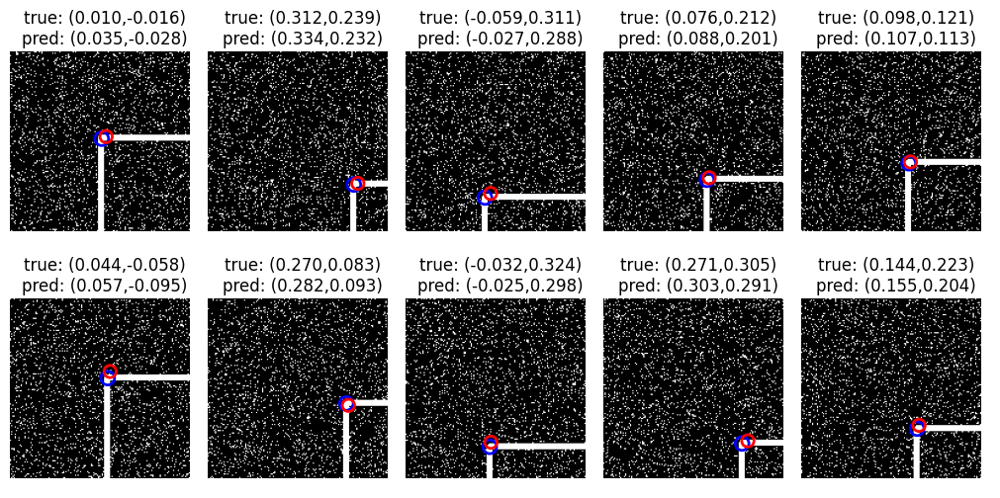

In [ ]:
plot_dataset(train_data, model)

In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=2)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.46s/epoch: loss: 0.0227  mae: 0.1279  
Epoch    10 - 216.40ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    15 - 142.73ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    20 - 139.06ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    25 - 162.58ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    30 - 237.51ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    35 - 208.73ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    40 - 176.53ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    45 - 164.90ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    50 - 218.62ms/epoch: loss: 0.0208  mae: 0.1241  
Total training time: 15.6 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=4)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.16s/epoch: loss: 0.0205  mae: 0.1231  
Epoch    10 - 147.28ms/epoch: loss: 0.0191  mae: 0.1186  
Epoch    15 - 185.46ms/epoch: loss: 0.0109  mae: 0.0815  
Epoch    20 - 266.03ms/epoch: loss: 0.0095  mae: 0.0732  
Epoch    25 - 172.83ms/epoch: loss: 0.0087  mae: 0.0686  
Epoch    30 - 224.56ms/epoch: loss: 0.0080  mae: 0.0653  
Epoch    35 - 253.38ms/epoch: loss: 0.0071  mae: 0.0609  
Epoch    40 - 263.21ms/epoch: loss: 0.0064  mae: 0.0579  
Epoch    45 - 192.12ms/epoch: loss: 0.0062  mae: 0.0565  
Epoch    50 - 190.16ms/epoch: loss: 0.0056  mae: 0.0533  
Total training time: 15.3 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=8)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.53s/epoch: loss: 0.0203  mae: 0.1223  
Epoch    10 - 422.19ms/epoch: loss: 0.0087  mae: 0.0694  
Epoch    15 - 295.53ms/epoch: loss: 0.0056  mae: 0.0481  
Epoch    20 - 245.30ms/epoch: loss: 0.0048  mae: 0.0435  
Epoch    25 - 280.92ms/epoch: loss: 0.0042  mae: 0.0399  
Epoch    30 - 286.95ms/epoch: loss: 0.0035  mae: 0.0366  
Epoch    35 - 233.51ms/epoch: loss: 0.0029  mae: 0.0338  
Epoch    40 - 231.84ms/epoch: loss: 0.0025  mae: 0.0338  
Epoch    45 - 221.84ms/epoch: loss: 0.0016  mae: 0.0271  
Epoch    50 - 243.59ms/epoch: loss: 0.0012  mae: 0.0252  
Total training time: 19.9 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=16)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.10s/epoch: loss: 0.0205  mae: 0.1232  
Epoch    10 - 304.75ms/epoch: loss: 0.0071  mae: 0.0588  
Epoch    15 - 267.17ms/epoch: loss: 0.0046  mae: 0.0403  
Epoch    20 - 285.34ms/epoch: loss: 0.0036  mae: 0.0361  
Epoch    25 - 300.98ms/epoch: loss: 0.0016  mae: 0.0261  
Epoch    30 - 271.01ms/epoch: loss: 0.0010  mae: 0.0230  
Epoch    35 - 278.61ms/epoch: loss: 0.0007  mae: 0.0192  
Epoch    40 - 268.65ms/epoch: loss: 0.0008  mae: 0.0223  
Epoch    45 - 274.87ms/epoch: loss: 0.0005  mae: 0.0183  
Epoch    50 - 272.49ms/epoch: loss: 0.0006  mae: 0.0197  
Total training time: 18.1 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=32)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.85s/epoch: loss: 0.0168  mae: 0.1082  
Epoch    10 - 472.53ms/epoch: loss: 0.0047  mae: 0.0402  
Epoch    15 - 432.57ms/epoch: loss: 0.0037  mae: 0.0345  
Epoch    20 - 474.02ms/epoch: loss: 0.0019  mae: 0.0278  
Epoch    25 - 478.61ms/epoch: loss: 0.0005  mae: 0.0165  
Epoch    30 - 434.30ms/epoch: loss: 0.0003  mae: 0.0140  
Epoch    35 - 436.52ms/epoch: loss: 0.0003  mae: 0.0125  
Epoch    40 - 431.29ms/epoch: loss: 0.0003  mae: 0.0126  
Epoch    45 - 438.85ms/epoch: loss: 0.0001  mae: 0.0078  
Epoch    50 - 514.79ms/epoch: loss: 0.0001  mae: 0.0069  
Total training time: 29.8 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=64)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.54s/epoch: loss: 0.0075  mae: 0.0588  
Epoch    10 - 564.41ms/epoch: loss: 0.0039  mae: 0.0339  
Epoch    15 - 545.46ms/epoch: loss: 0.0009  mae: 0.0200  
Epoch    20 - 559.01ms/epoch: loss: 0.0008  mae: 0.0181  
Epoch    25 - 538.17ms/epoch: loss: 0.0003  mae: 0.0133  
Epoch    30 - 596.19ms/epoch: loss: 0.0002  mae: 0.0108  
Epoch    35 - 564.81ms/epoch: loss: 0.0001  mae: 0.0087  
Epoch    40 - 544.70ms/epoch: loss: 0.0002  mae: 0.0117  
Epoch    45 - 538.89ms/epoch: loss: 0.0001  mae: 0.0085  
Epoch    50 - 538.06ms/epoch: loss: 0.0001  mae: 0.0082  
Total training time: 32.6 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=128)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 2.04s/epoch: loss: 0.0149  mae: 0.0982  
Epoch    10 - 758.93ms/epoch: loss: 0.0040  mae: 0.0339  
Epoch    15 - 878.51ms/epoch: loss: 0.0017  mae: 0.0267  
Epoch    20 - 628.91ms/epoch: loss: 0.0009  mae: 0.0194  
Epoch    25 - 628.58ms/epoch: loss: 0.0006  mae: 0.0169  
Epoch    30 - 770.95ms/epoch: loss: 0.0003  mae: 0.0109  
Epoch    35 - 636.62ms/epoch: loss: 0.0002  mae: 0.0096  
Epoch    40 - 626.07ms/epoch: loss: 0.0002  mae: 0.0103  
Epoch    45 - 763.68ms/epoch: loss: 0.0001  mae: 0.0091  
Epoch    50 - 630.24ms/epoch: loss: 0.0001  mae: 0.0067  
Total training time: 41.8 sec


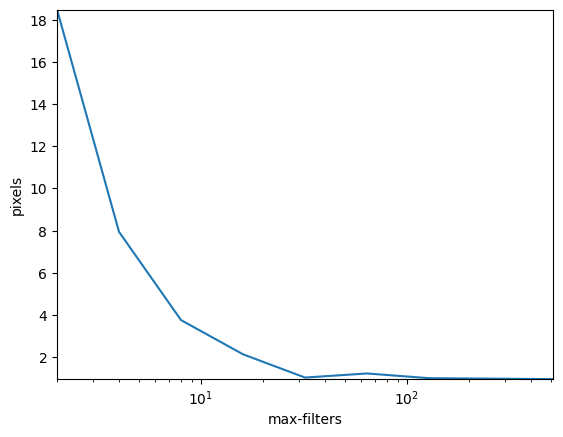

In [ ]:
# Comparing
data = np.array([
  [2, 0.1241],
  [4, 0.0533],
  [8, 0.0252],
  [16, 0.0143],
  [32, 0.0069],
  [64, 0.0082],
  [128, 0.0067],
  [512, 0.0064]
])
plt.plot(data[:,0], data[:,1]*149)
plt.xscale('log')
plt.xlabel('max-filters')
plt.ylabel('pixels')
plt.margins(0)
plt.show()

In [ ]:
def run_trials(trial_keys, trail_fn):
  """
  For each trial key, instantiates a model, runs a fixed number of epochs, and collects the best achieved metrics
  (minimum loss/error).

  Usage example:
    trials = run_trials([4,8,16,32,64,128,256,512], lambda trial_key: extreme_chatgpt_model(max_filters=trial_key), lambda: train_data.batch(32))
    plt.plot(trials['trial_keys'], trials['loss'])
    plt.plot(trials['trial_keys'], trials['val-mae'])

  Returns:
  dict:
    "trial_keys" - array
    "loss" - array
    "{metric-name}" - array
  """

# usage:

In [ ]:
[1]*3 + [0, 0]

[1, 1, 1, 0, 0]

## Position-aware models
Now my own attempts at creating models that are spatially-capable by having explicit encoding for spatial information.

A common theme is the distinction between semantic and spatial information:
* conv layers are good at identifying the presence of semantic features (ie: classification) across the grid
* conv layers are good at manipulating semantic features through the layers
* spatial information needs to be explicitly injected
* conv layers may be poor at manipulating spatial coordinates. In particular, spatial coordinates lack any semantic information so need to be combined with semantic features when manipulating, eg: via dot products. Standard Weights,biases, and ReLU activation functions are not good at such manipulation.

### StrideGrid-based with Positionwise MaxPool
StrideGrid provides relative coordinates, at the resolution of the stride-patch. This model injects a StrideGrid at each resolution, which is initially selected via PositionwiseMaxPool, but then becomes normal input to the subsequent conv block.

Spatial information flow:
* Provides fine-grained relative coordinates in first block
* Provides increasingly course-grained relative coordinates in each subsquent block
* Expected to pass spatial coordinates through and then combine at the end.
* In theory, final regression is a simple weighted sum of those coordinates.

Problems:
* The coordinates provided at the earlier layers must travel through so many subsequent conv layers. They're likely to get corrupted along the way.
* It's questionable whether conv layers are even capable of conveying the coordinates reliably through the layers.
* The earlier layers only have local information, while the later layers only have course-grained global information. The determination of final positions needs integration through all spatial levels PLUS via combination of semantic information and the passed-through spatial information.

Suggestions:
* Retain spatial coordinates from each block as-is, without being passed into semantic convs. This will accumulate the number of spatial channels each block.

In [ ]:
# With explicit tracking of position info
# - using Stride-Grid
def positionwise_model(min_filters=4, max_filters=4096):
  def downscale(filters, x):
    channel_weights = [1]*(filters) + [0, 0]
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    coords = StrideGrid2D(strides=(2, 2))(x)
    x = layers.Concatenate()([x, coords])
    x = PositionwiseMaxPool2D(pool_size=(2, 2), channel_weights=channel_weights)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  filters = min_filters
  x = downscale(min(filters*1, max_filters), x)  # 74x74x(4+2)
  x = downscale(min(filters*2, max_filters), x)  # 37x37x(8+2)
  x = downscale(min(filters*4, max_filters), x)  # 18x18x(16+2)
  x = downscale(min(filters*8, max_filters), x)  # 9x9x(32+2)
  x = downscale(min(filters*16, max_filters), x) # 4x4x(64+2)
  x = downscale(min(filters*32, max_filters), x) # 2x2x(128+2)
  x = downscale(min(filters*32, max_filters), x) # 1x1x(128+2)
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

positionwise_model().summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 149, 149,  │         40 │ input_layer_2[0]… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 149, 149,  │        148 │ conv2d[0][0]      │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stride_grid2d_3     │ (None, 149, 149,  │          0 │ conv2d_1[0][0]    │
│ (StrideGrid2D)      │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 149, 149,  │          0 │ conv2d_1[0][0],   │
│ (Concatenate)       │ 6)                │            │ stride_grid2d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 74, 74, 6) │          0 │ concatenate_2[0]… │
│ (PositionwiseMaxPo… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 74, 74, 8) │        440 │ positionwise_max… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 74, 74, 8) │        584 │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stride_grid2d_4     │ (None, 74, 74, 2) │          0 │ conv2d_3[0][0]    │
│ (StrideGrid2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 74, 74,    │          0 │ conv2d_3[0][0],   │
│ (Concatenate)       │ 10)               │            │ stride_grid2d_4[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 37, 37,    │          0 │ concatenate_3[0]… │
│ (PositionwiseMaxPo… │ 10)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 37, 37,    │      1,456 │ positionwise_max… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 37, 37,    │      2,320 │ conv2d_4[0][0]    │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stride_grid2d_5     │ (None, 37, 37, 2) │          0 │ conv2d_5[0][0]    │
│ (StrideGrid2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 37, 37,    │          0 │ conv2d_5[0][0],   │
│ (Concatenate)       │ 18)               │            │ stride_grid2d_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 18, 18,    │          0 │ concatenate_4[0]… │
│ (PositionwiseMaxPo… │ 18)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 18, 18,    │      5,216 │ positionwise_max… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 597,506 (2.28 MB)

 Trainable params: 597,506 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = positionwise_model(min_filters=16, max_filters=512)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 7.85s/epoch: loss: 0.0213  mae: 0.1261  
Epoch    10 - 1.90s/epoch: loss: 0.0021  mae: 0.0341  
Epoch    15 - 1.75s/epoch: loss: 0.0004  mae: 0.0160  
Epoch    20 - 1.75s/epoch: loss: 0.0003  mae: 0.0125  
Epoch    25 - 1.75s/epoch: loss: 0.0002  mae: 0.0102  
Epoch    30 - 1.77s/epoch: loss: 0.0001  mae: 0.0089  
Epoch    35 - 1.76s/epoch: loss: 0.0001  mae: 0.0094  
Epoch    40 - 1.75s/epoch: loss: 0.0001  mae: 0.0079  
Epoch    45 - 1.76s/epoch: loss: 0.0001  mae: 0.0081  
Epoch    50 - 1.94s/epoch: loss: 0.0001  mae: 0.0074  
Total training time: 119.9 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step
pred.x: -0.12868429720401764..0.42711102962493896
pred.y: -0.10100072622299194..0.42395374178886414


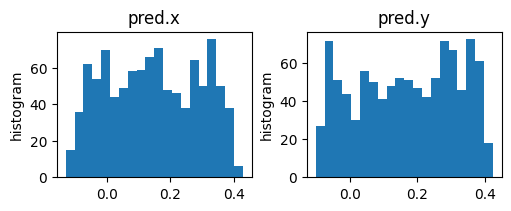

In [ ]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


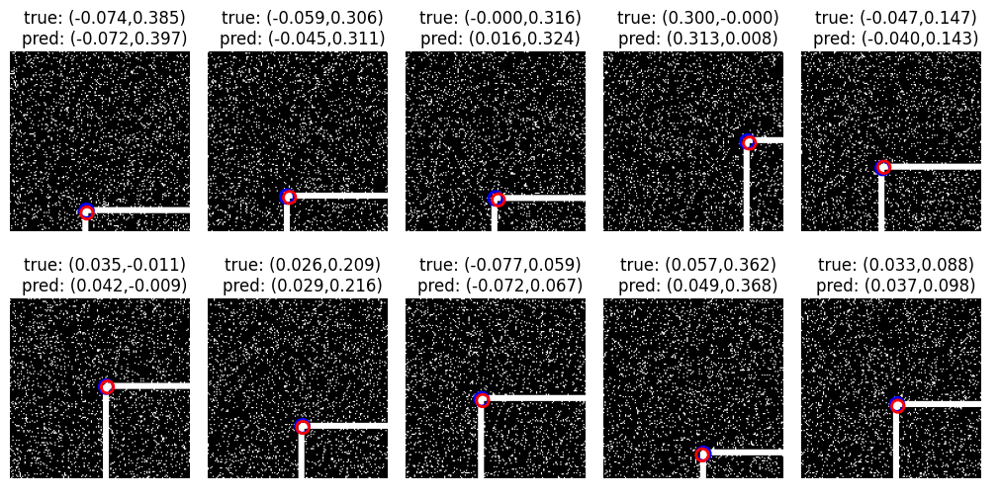

In [ ]:
plot_dataset(train_data, model)

### CoordGrid-based with Positionwise MaxPool
CoordGrid provides global coordinates. This model injects a single CoordGrid at the input, and then passes it through via PositionWiseMaxPool.

Spatial information flow:
* Provides global and absolute fine-grained coordinates at first block.
* Subsequent blocks continue to select passed-through coordinate based on max feature location.
* The coordinates are only ever selected, never manipulated.

Variations:
* Drop semantic feature channels in last layer, because they're superfluous and likely to mess up the coordinate values.

Problems:
* No gradient flow for feature channels.
* Even if feature channels are included in output block via Dense layer, their meaning and purpose is vague.

Suggestions:
* Use "expected coordinates" instead of max-feature coordinates.
* Find some other way of giving the features meaning.

In [ ]:
# With explicit tracking of position info
# - Global positioning via CoordGrid, initialised at start and forwarded through layers
# - note: if we take the final output directly from the coord channels then the gradients fail to get passed up
#   through the filters and the model doesn't train.
#   It appears that max-pool blocks the gradients.
#   In other words, it's ok to use conditionals, but:
#    - the conditional test doesn't have any gradients passed through it,
#    - gradients must still pass through the values through some other pathway.
#    - this suggests that a model based on expected-position would do better.
def coordconv_model(min_filters=4, max_filters=4096, include_final_features=False):
  def downscale(filters, inp):
    x = inp[..., :-2]
    coords = inp[..., -2:]
    channel_weights = [1]*(filters) + [0, 0]

    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Concatenate()([x, coords])
    x = PositionwiseMaxPool2D(pool_size=(2, 2), channel_weights=channel_weights)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  filters = min_filters
  coords = CoordGrid2D()(x)
  x = layers.Concatenate()([x, coords])
  x = downscale(min(filters*1, max_filters), x)  # 74x74x4
  x = downscale(min(filters*2, max_filters), x)  # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x) # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  if include_final_features:
    x = layers.Dense(2, kernel_initializer='normal')(x)
  else:
    x = x[..., -2:] # take coords

  return tf.keras.Model(inputs=input, outputs=x)

coordconv_model().summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ coord_grid2d_7      │ (None, 149, 149,  │          0 │ input_layer_6[0]… │
│ (CoordGrid2D)       │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_33      │ (None, 149, 149,  │          0 │ input_layer_6[0]… │
│ (Concatenate)       │ 3)                │            │ coord_grid2d_7[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_43         │ (None, 149, 149,  │          0 │ concatenate_33[0… │
│ (GetItem)           │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_56 (Conv2D)  │ (None, 149, 149,  │         40 │ get_item_43[0][0] │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 149, 149,  │        148 │ conv2d_56[0][0]   │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_44         │ (None, 149, 149,  │          0 │ concatenate_33[0… │
│ (GetItem)           │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_34      │ (None, 149, 149,  │          0 │ conv2d_57[0][0],  │
│ (Concatenate)       │ 6)                │            │ get_item_44[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 74, 74, 6) │          0 │ concatenate_34[0… │
│ (PositionwiseMaxPo… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_45         │ (None, 74, 74, 4) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 74, 74, 8) │        296 │ get_item_45[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 74, 74, 8) │        584 │ conv2d_58[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_46         │ (None, 74, 74, 2) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_35      │ (None, 74, 74,    │          0 │ conv2d_59[0][0],  │
│ (Concatenate)       │ 10)               │            │ get_item_46[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 37, 37,    │          0 │ concatenate_35[0… │
│ (PositionwiseMaxPo… │ 10)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_47         │ (None, 37, 37, 8) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_60 (Conv2D)  │ (None, 37, 37,    │      1,168 │ get_item_47[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 590,476 (2.25 MB)

 Trainable params: 590,476 (2.25 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = coordconv_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger(), tinstr.HistoryStats()])

Epoch     5 - 3.45s/epoch: loss: 0.0395  mae: 0.1614  
Epoch    10 - 494.99ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    15 - 434.36ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    20 - 496.61ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    25 - 410.72ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    30 - 407.79ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    35 - 417.87ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    40 - 415.54ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    45 - 480.02ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    50 - 422.61ms/epoch: loss: 0.0395  mae: 0.1614  
Total training time: 37.2 sec


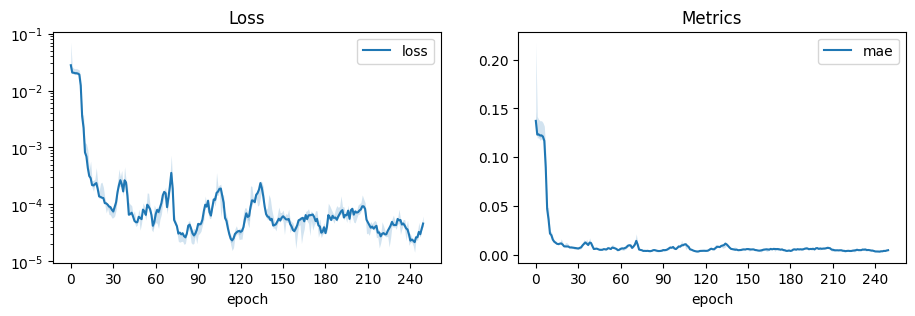

In [ ]:
tinstr.plot_train_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


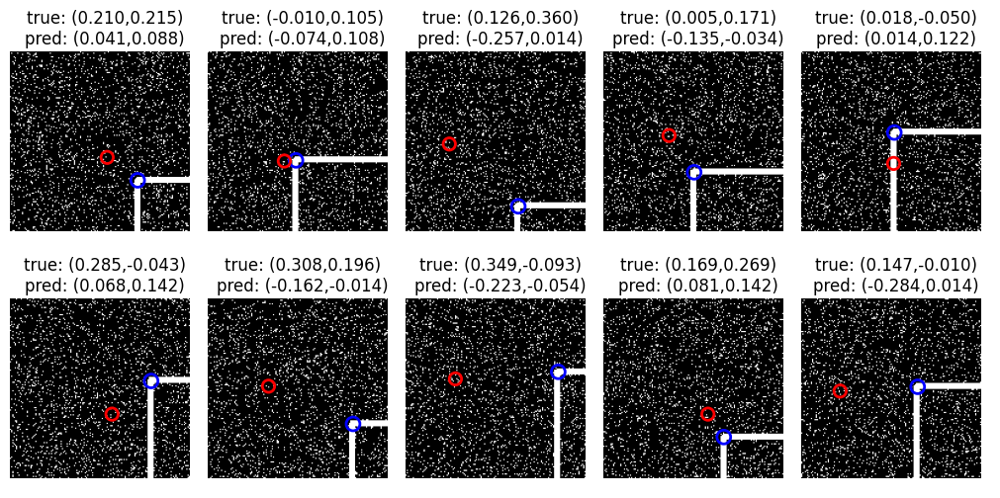

In [ ]:
plot_dataset(train_data, model)

prediction:      [[ 0.04054058  0.08783787]
 [-0.07432431  0.1081081 ]
 [-0.25675675  0.01351351]
 [-0.13513511 -0.03378376]
 [ 0.01351351  0.12162161]]
all layers:      [TensorShape([5, 149, 149, 1]), TensorShape([5, 149, 149, 2]), TensorShape([5, 149, 149, 3]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 6]), TensorShape([5, 74, 74, 6]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 10]), TensorShape([5, 37, 37, 10]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 18]), TensorShape([5, 18, 18, 18]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 34]), TensorShape([5, 9, 9, 34]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 66]), TensorShape([5, 4, 4, 66]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 130]), TensorShape([5, 2, 2, 130]), TensorShape([5, 2, 2, 128]), T

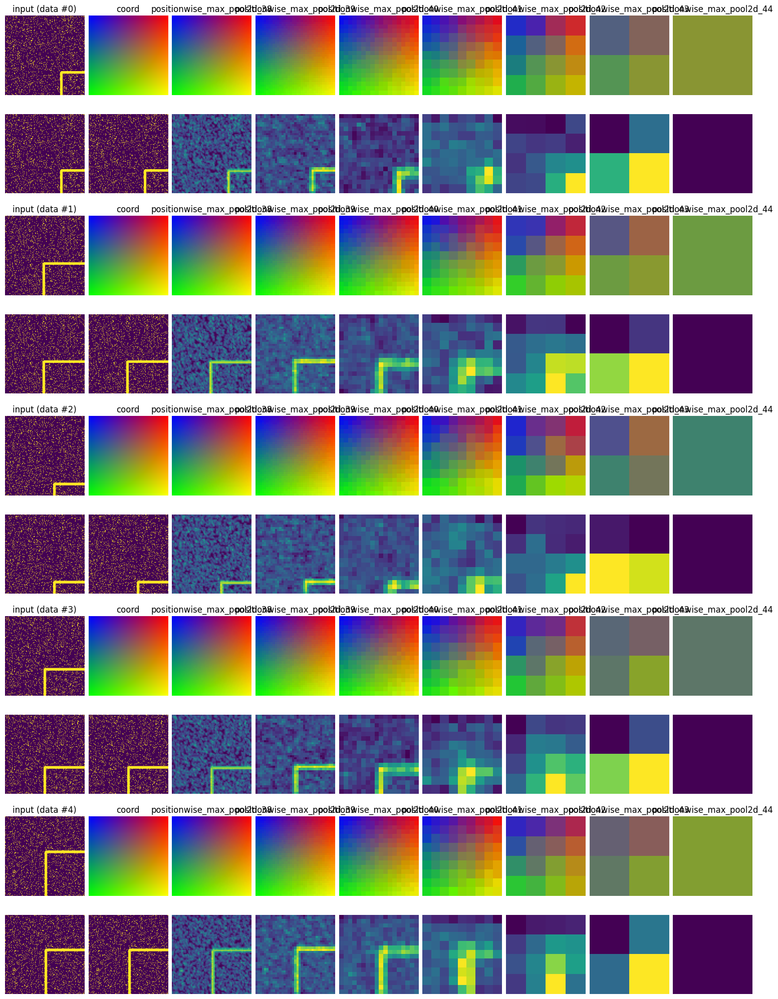

In [ ]:
plot_layers(model, train_data, r'positionwise_.*', has_coord_layers=True, num=5)

prediction:      [[ 0.04054058  0.08783787]
 [-0.07432431  0.1081081 ]
 [-0.25675675  0.01351351]
 [-0.13513511 -0.03378376]
 [ 0.01351351  0.12162161]]
all layers:      [TensorShape([5, 149, 149, 1]), TensorShape([5, 149, 149, 2]), TensorShape([5, 149, 149, 3]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 6]), TensorShape([5, 74, 74, 6]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 10]), TensorShape([5, 37, 37, 10]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 18]), TensorShape([5, 18, 18, 18]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 34]), TensorShape([5, 9, 9, 34]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 66]), TensorShape([5, 4, 4, 66]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 130]), TensorShape([5, 2, 2, 130]), TensorShape([5, 2, 2, 128]), T

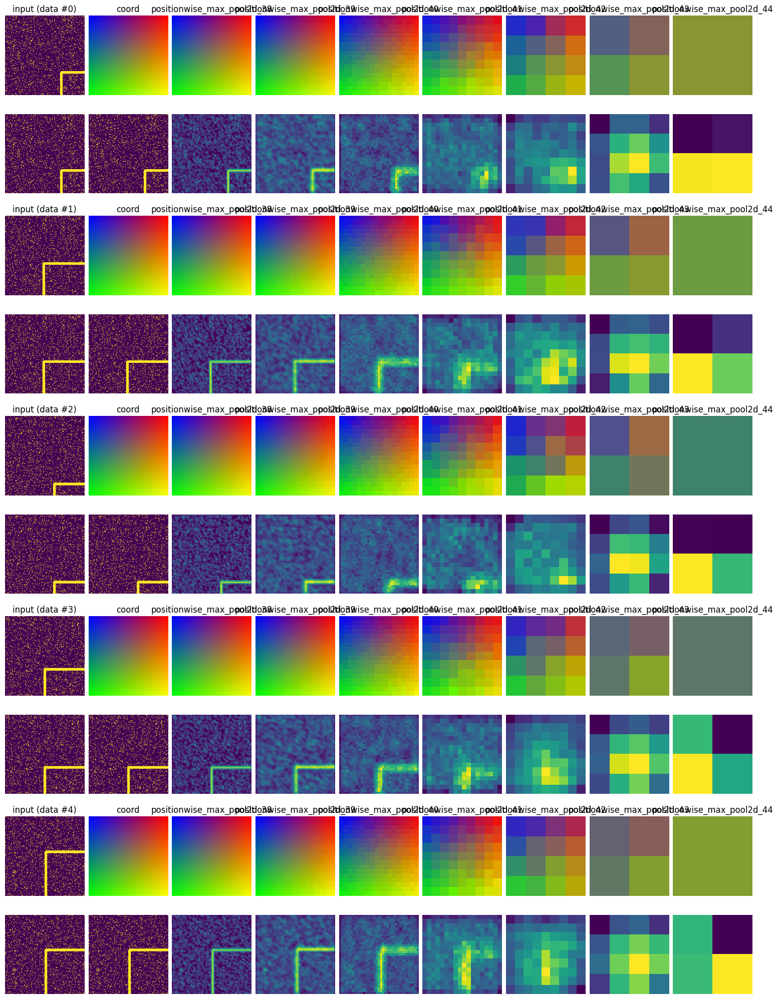

In [ ]:
# plotting max features BEFORE spatial coord selection
def plot_layers2(model, dataset, layer_filter, has_coord_layers=False, num=1):
  layer_indices = index_layers_by_name_pattern(model, layer_filter)

  # prepare model
  monitoring_model = tf.keras.Model(
      inputs=tinstr._original_inputs(model),
      outputs=[model.outputs] + [layer.output for layer in model.layers])

  # do prediction
  dataset = dataset.take(num).batch(num)
  data = next(iter(dataset))[0]
  out = monitoring_model(data)
  prediction = out[0][0]
  layer_outputs = out[1:]
  print(f"prediction:      {prediction}")
  print(f"all layers:      {[t.shape for t in layer_outputs]}")
  print(f"filtered layers: {[layer_outputs[l_idx].shape for l_idx in layer_indices]}")

  coord_layer = None
  coord_grid_indices = index_layers_by_name_pattern(model, r'coord_grid2d_.*')
  if has_coord_layers and len(coord_grid_indices) > 0:
    coord_layer = layer_outputs[coord_grid_indices[0]]

  cols = 1+len(layer_indices)
  if coord_layer is not None:
    cols += 1
  rows = num*2 if has_coord_layers else num

  plt.figure(figsize=(15,2*rows), layout='constrained')

  for idx in range(num):
    row = idx*2 if has_coord_layers else idx
    col = 0
    plt.subplot(rows, cols, 1 + (row*cols) + col)
    plt.title(f"input (data #{idx})")
    plt.imshow(data[idx,:,:,0])
    plt.axis('off')

    if has_coord_layers:
      if coord_layer is not None:
        col += 1
        plt.subplot(rows, cols, 1 + (row*cols) + col)
        plt.title(f"coord")
        plt.imshow(coords_to_rgb(coord_layer[idx,:,:,-2:]))
        plt.axis('off')

      for l_idx in layer_indices:
        layer = model.layers[l_idx]
        layer_data = layer_outputs[l_idx]
        col += 1
        plt.subplot(rows, cols, 1 + (row*cols) + col)
        plt.title(f"{layer.name}")
        plt.imshow(coords_to_rgb(layer_data[idx,:,:,-2:]))
        plt.axis('off')

    row = (idx*2 + 1) if has_coord_layers else idx
    col = 0
    plt.subplot(rows, cols, 1 + (row*cols) + col)
    plt.imshow(data[idx,:,:,0])
    plt.axis('off')

    if coord_layer is not None:
      col += 1
      plt.subplot(rows, cols, 1 + (row*cols) + col)
      plt.imshow(flatten_channels(data[idx]))
      plt.axis('off')

    for l_idx in layer_indices:
      layer = model.layers[l_idx-1]
      layer_data = layer_outputs[l_idx-1]
      if has_coord_layers:
        layer_data = layer_data[..., :-2]
      col += 1
      plt.subplot(rows, cols, 1 + (row*cols) + col)
      plt.imshow(flatten_channels(layer_data[idx]))
      plt.axis('off')

plot_layers2(model, train_data, r'positionwise_.*', has_coord_layers=True, num=5)

### Global-feature context via UNet
In a conv model, each layer only has partial information, so it's hard to accurately select the coordinates because no layer has all the right information. This leads to an alternative idea, of using a UNet for identifying globally informed semantic features only, at full resolution, and then converting to coordinates.

This first attempt has an additional downscaling leg.

In [ ]:
# CoordConv model with UNet for feature context
# With explicit tracking of position info
# - Explicitly retains position tracking
def coord_unet_model(min_filters=4, max_filters=4096):
  def feature_downscale(filters, inp):
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(inp)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    skip = x
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    return x, skip

  def feature_upscale(filters, inp, skip):
    x = layers.Conv2DTranspose(filters, kernel_size=(2, 2), strides=2, padding='same')(inp)
    if x.shape[1] != skip.shape[1]:
      x = layers.ZeroPadding2D(padding=((0, 1), (0, 1)))(x)
    x = layers.Add()([x, skip])
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    return x

  def spatial_downscale(filters, inp):
    x = inp[..., :-2]
    coords = inp[..., -2:]
    channel_weights = [1]*(filters) + [0, 0]

    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Concatenate()([x, coords])
    x = PositionwiseMaxPool2D(pool_size=(2, 2), channel_weights=channel_weights)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  filters = min_filters

  # Semantic UNet
  # 149x149x1 -> 1x1x128 + 2x2x128
  x, skip1 = feature_downscale(min(filters*1, max_filters), x)  # 74x74x4
  x, skip2 = feature_downscale(min(filters*2, max_filters), x)  # 37x37x8
  x, skip3 = feature_downscale(min(filters*4, max_filters), x)  # 18x18x16
  x, skip4 = feature_downscale(min(filters*8, max_filters), x)  # 9x9x32,  18x18x32
  x, skip5 = feature_downscale(min(filters*16, max_filters), x) # 4x4x64,  9x9x64
  x, skip6 = feature_downscale(min(filters*32, max_filters), x) # 2x2x128, 4x4x128
  x, skip7 = feature_downscale(min(filters*32, max_filters), x) # 1x1x128, 2x2x128

  # 1x1x128 + 2x2x128 -> 149x149x4
  x = feature_upscale(min(filters*32, max_filters), x, skip7) # 1x1x128 + 2x2x128 -> 2x2x128
  x = feature_upscale(min(filters*32, max_filters), x, skip6) # 2x2x128 + 4x4x128 -> 4x4x64
  x = feature_upscale(min(filters*16, max_filters), x, skip5) # 4x4x64  + 9x9x64  -> 9x9x32
  x = feature_upscale(min(filters*8, max_filters), x, skip4)
  x = feature_upscale(min(filters*4, max_filters), x, skip3)
  x = feature_upscale(min(filters*2, max_filters), x, skip2)
  x = feature_upscale(min(filters*1, max_filters), x, skip1) # -> 149x149x4

  # Spatial coord-conv net
  # 149x149x4 + 149x149x2 -> 1x1x128
  coords = CoordGrid2D()(x)
  x = layers.Concatenate()([x, coords])
  x = spatial_downscale(min(filters*1, max_filters), x)  # 74x74x4
  x = spatial_downscale(min(filters*2, max_filters), x)  # 37x37x8
  x = spatial_downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = spatial_downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = spatial_downscale(min(filters*16, max_filters), x) # 4x4x64
  x = spatial_downscale(min(filters*32, max_filters), x) # 2x2x128
  x = spatial_downscale(min(filters*32, max_filters), x) # 1x1x128

  # output
  # 1x1x128 -> 2
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

coord_unet_model().summary()

Model: "functional_98"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_44      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_523 (Conv2D) │ (None, 149, 149,  │         40 │ input_layer_44[0… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_524 (Conv2D) │ (None, 149, 149,  │        148 │ conv2d_523[0][0]  │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_150   │ (None, 74, 74, 4) │          0 │ conv2d_524[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_525 (Conv2D) │ (None, 74, 74, 8) │        296 │ max_pooling2d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_526 (Conv2D) │ (None, 74, 74, 8) │        584 │ conv2d_525[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_151   │ (None, 37, 37, 8) │          0 │ conv2d_526[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_527 (Conv2D) │ (None, 37, 37,    │      1,168 │ max_pooling2d_15… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_528 (Conv2D) │ (None, 37, 37,    │      2,320 │ conv2d_527[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_152   │ (None, 18, 18,    │          0 │ conv2d_528[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_529 (Conv2D) │ (None, 18, 18,    │      4,640 │ max_pooling2d_15… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_530 (Conv2D) │ (None, 18, 18,    │      9,248 │ conv2d_529[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_153   │ (None, 9, 9, 32)  │          0 │ conv2d_530[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_531 (Conv2D) │ (None, 9, 9, 64)  │     18,496 │ max_pooling2d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_532 (Conv2D) │ (None, 9, 9, 64)  │     36,928 │ conv2d_531[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_154   │ (None, 4, 4, 64)  │          0 │ conv2d_532[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_533 (Conv2D) │ (None, 4, 4, 128) │     73,856 │ max_pooling2d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_534 (Conv2D) │ (None, 4, 4, 128) │    147,584 │ conv2d_533[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_155   │ (None, 2, 2, 128) │          0 │ conv2d_534[0][0]

 Total params: 2,045,214 (7.80 MB)

 Trainable params: 2,045,214 (7.80 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = coord_unet_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 8.02s/epoch: loss: 0.0019  mae: 0.0345  
Epoch    10 - 1.25s/epoch: loss: 0.0002  mae: 0.0119  
Epoch    15 - 1.25s/epoch: loss: 0.0002  mae: 0.0101  
Epoch    20 - 1.25s/epoch: loss: 0.0002  mae: 0.0104  
Epoch    25 - 1.22s/epoch: loss: 0.0001  mae: 0.0085  
Epoch    30 - 1.22s/epoch: loss: 0.0001  mae: 0.0088  
Epoch    35 - 1.19s/epoch: loss: 0.0002  mae: 0.0110  
Epoch    40 - 1.22s/epoch: loss: 0.0001  mae: 0.0057  
Epoch    45 - 1.18s/epoch: loss: 0.0000  mae: 0.0050  
Epoch    50 - 1.21s/epoch: loss: 0.0001  mae: 0.0060  
Total training time: 95.1 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


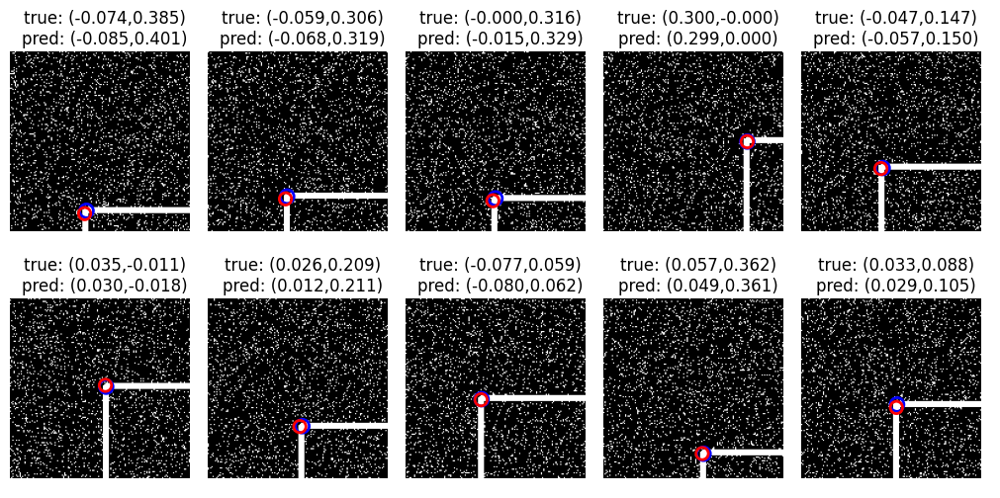

In [ ]:
plot_dataset(train_data, model)

prediction:      [[-8.4680632e-02  4.0082926e-01]
 [-6.8022005e-02  3.1867200e-01]
 [-1.4779484e-02  3.2909876e-01]
 [ 2.9939482e-01  2.5764853e-04]
 [-5.7144068e-02  1.4995562e-01]]
all layers:      [TensorShape([5, 149, 149, 1]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 4]), TensorShape([5, 74, 74, 4]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 8]), TensorShape([5, 37, 37, 8]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 16]), TensorShape([5, 18, 18, 16]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 32]), TensorShape([5, 9, 9, 32]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 64]), TensorShape([5, 4, 4, 64]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 1, 1, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 4, 4, 128]), TensorSha

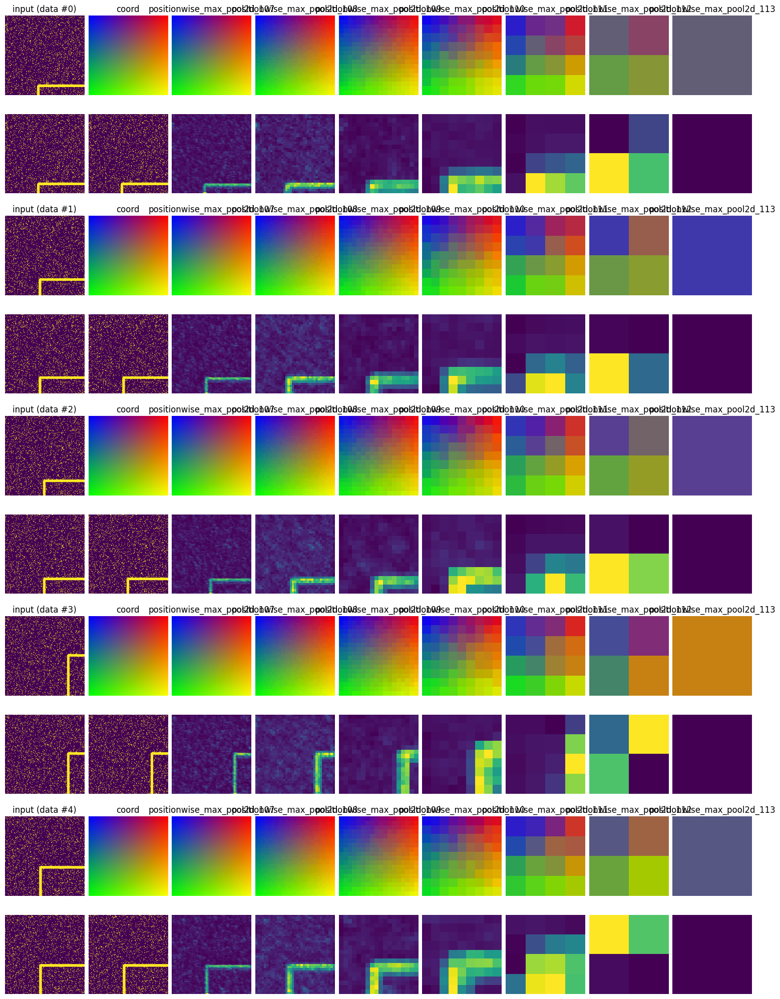

In [ ]:
plot_layers(model, train_data, r'positionwise_.*', has_coord_layers=True, num=5)

### Global-feature context via Dilation
An alternative way to get a more global-ish semantic feature is to use the combination of a larger kernel plus dilation. This first one just uses a larger kernel to test out the basic idea -- does it improve on the accuracy?

Answer: it doesn't seem to.

In [ ]:
# CoordConv model with larger kernels
# The efficient way to do this is to run multiple scales at the same time and then concatenate, eg:
#  - 3x3, 3x3xdilate2, 3x3xdilate4, 3x3xdilate8, concatenate, then pointwise-convolve
def dilated_coordconv_model(min_filters=4, max_filters=4096):
  def downscale(filters, inp):
    x = inp[..., :-2]
    coords = inp[..., -2:]
    channel_weights = [1]*(filters) + [0, 0]

    x = layers.Conv2D(filters, kernel_size=(7, 7), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(7, 7), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Concatenate()([x, coords])
    x = PositionwiseMaxPool2D(pool_size=(2, 2), channel_weights=channel_weights)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  filters = min_filters
  coords = CoordGrid2D()(x)
  x = layers.Concatenate()([x, coords])
  x = downscale(min(filters*1, max_filters), x)  # 74x74x4
  x = downscale(min(filters*2, max_filters), x)  # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x) # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

dilated_coordconv_model().summary()

Model: "functional_102"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_46      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ coord_grid2d_41     │ (None, 149, 149,  │          0 │ input_layer_46[0… │
│ (CoordGrid2D)       │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_180     │ (None, 149, 149,  │          0 │ input_layer_46[0… │
│ (Concatenate)       │ 3)                │            │ coord_grid2d_41[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_56         │ (None, 149, 149,  │          0 │ concatenate_180[… │
│ (GetItem)           │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_607 (Conv2D) │ (None, 149, 149,  │        200 │ get_item_56[0][0] │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_608 (Conv2D) │ (None, 149, 149,  │        788 │ conv2d_607[0][0]  │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_57         │ (None, 149, 149,  │          0 │ concatenate_180[… │
│ (GetItem)           │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_181     │ (None, 149, 149,  │          0 │ conv2d_608[0][0], │
│ (Concatenate)       │ 6)                │            │ get_item_57[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 74, 74, 6) │          0 │ concatenate_181[… │
│ (PositionwiseMaxPo… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_58         │ (None, 74, 74, 4) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_609 (Conv2D) │ (None, 74, 74, 8) │      1,576 │ get_item_58[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_610 (Conv2D) │ (None, 74, 74, 8) │      3,144 │ conv2d_609[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_59         │ (None, 74, 74, 2) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_182     │ (None, 74, 74,    │          0 │ conv2d_610[0][0], │
│ (Concatenate)       │ 10)               │            │ get_item_59[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 37, 37,    │          0 │ concatenate_182[… │
│ (PositionwiseMaxPo… │ 10)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_60         │ (None, 37, 37, 8) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_611 (Conv2D) │ (None, 37, 37,    │      6,288 │ get_item_60[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 3,211,698 (12.25 MB)

 Trainable params: 3,211,698 (12.25 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = dilated_coordconv_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 4.57s/epoch: loss: 0.0214  mae: 0.1270  
Epoch    10 - 829.97ms/epoch: loss: 0.0213  mae: 0.1266  
Epoch    15 - 866.00ms/epoch: loss: 0.0002  mae: 0.0101  
Epoch    20 - 940.71ms/epoch: loss: 0.0001  mae: 0.0075  
Epoch    25 - 1.03s/epoch: loss: 0.0001  mae: 0.0066  
Epoch    30 - 898.64ms/epoch: loss: 0.0001  mae: 0.0083  
Epoch    35 - 876.90ms/epoch: loss: 0.0000  mae: 0.0047  
Epoch    40 - 1.00s/epoch: loss: 0.0000  mae: 0.0044  
Epoch    45 - 905.81ms/epoch: loss: 0.0000  mae: 0.0054  
Epoch    50 - 912.54ms/epoch: loss: 0.0001  mae: 0.0063  
Total training time: 64.2 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


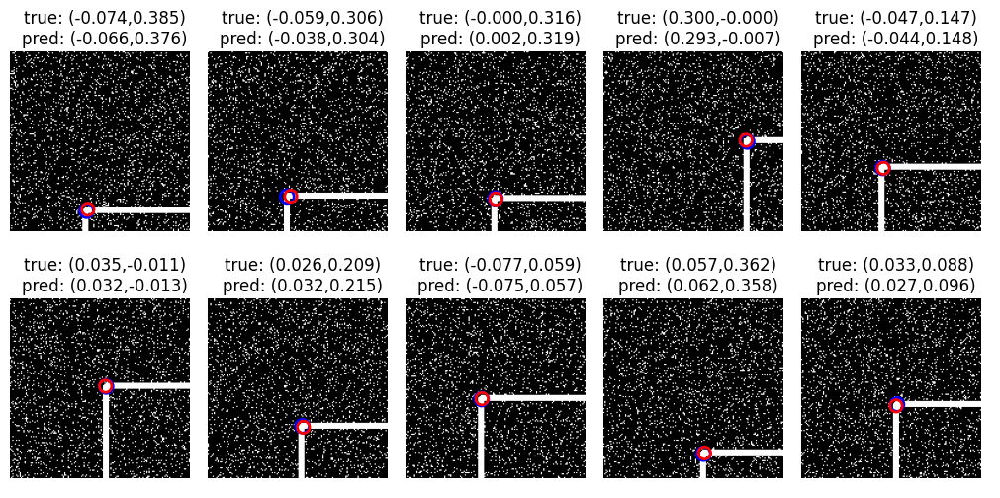

In [ ]:
plot_dataset(train_data, model)

prediction:      [[-0.0664694   0.37642998]
 [-0.03832216  0.30401942]
 [ 0.00201185  0.31873918]
 [ 0.29295465 -0.00726222]
 [-0.04370098  0.14841971]]
all layers:      [TensorShape([5, 149, 149, 1]), TensorShape([5, 149, 149, 2]), TensorShape([5, 149, 149, 3]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 6]), TensorShape([5, 74, 74, 6]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 10]), TensorShape([5, 37, 37, 10]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 18]), TensorShape([5, 18, 18, 18]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 34]), TensorShape([5, 9, 9, 34]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 66]), TensorShape([5, 4, 4, 66]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 130]), TensorShape([5, 2, 2, 130]), TensorShape([5, 2, 2, 128]), T

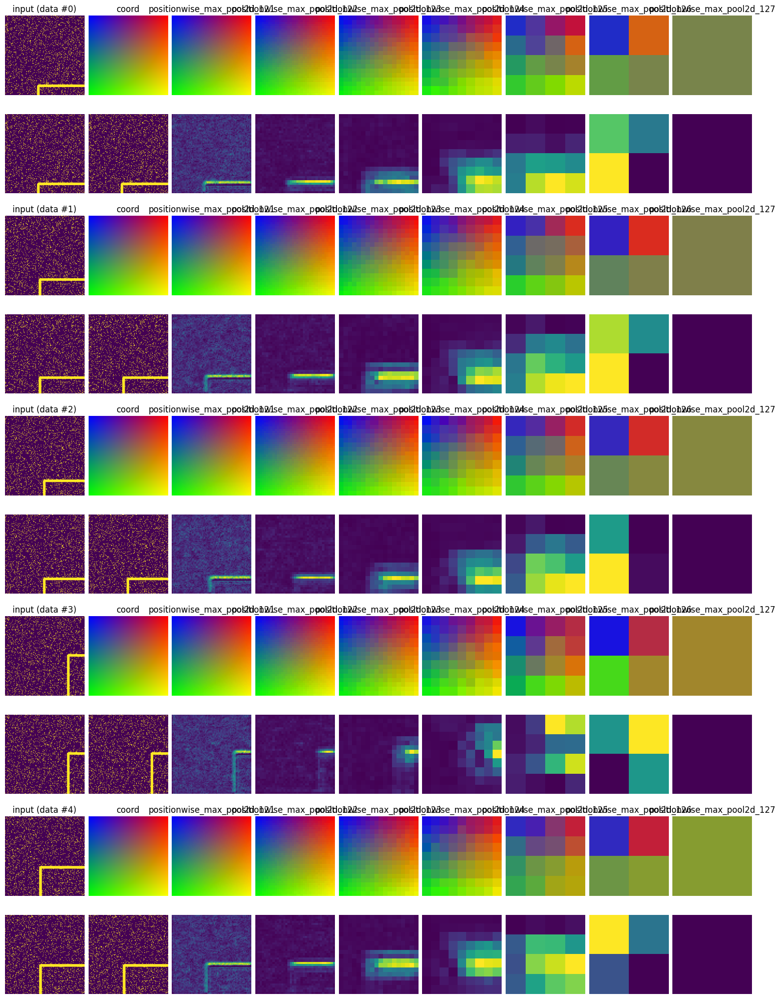

In [ ]:
plot_layers(model, train_data, r'positionwise_.*', has_coord_layers=True, num=5)

### Global feature context via ResNet
Continuing the same ideas. Here I'm trying out the use of a ResNet architecture, to see if that makes any improvement.

The first variant is just a basic ResNet as a baseline.
Then there's a variant with spatial coordinates.

In [ ]:
# Resnet version of baseline
# - Note: there are a few options for how to handle the downscaling of the skip connections.
#   The following is the description attributed to ShuffleNet: use an additive residual connection when input and output are of the same shape,
#   and use average pooling with concatenation when we down-sample the input spatially and double the output channels.
def resnet_model(min_filters=4, max_filters=4096):
  def downscale(filters, inp):
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', kernel_initializer='he_uniform')(inp)
    #x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)

    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', kernel_initializer='he_uniform')(x)
    #x = layers.BatchNormalization()(x)

    #skip = layers.Conv2D(filters, kernel_size=(1, 1), padding='same', kernel_initializer='he_uniform')(inp)
    #skip = layers.AveragePooling2D(pool_size=(2, 2))(skip)
    #x = layers.Add()([x, skip])

    skip = layers.AveragePooling2D(pool_size=(2, 2))(inp)
    x = layers.Concatenate()([x, skip])
    x = layers.Conv2D(filters, kernel_size=(1, 1), padding='same', kernel_initializer='he_uniform')(x)

    x = layers.Activation('relu')(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  # 149x149x1 -> 1x1x2
  filters = min_filters
  x = downscale(min(filters*1, max_filters), x)   # 74x74x4
  x = downscale(min(filters*2, max_filters), x)   # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x)  # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

resnet_model().summary()

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_34      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_342 (Conv2D) │ (None, 149, 149,  │         40 │ input_layer_34[0… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_158      │ (None, 149, 149,  │          0 │ conv2d_342[0][0]  │
│ (Activation)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_101   │ (None, 74, 74, 4) │          0 │ activation_158[0… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_343 (Conv2D) │ (None, 74, 74, 4) │        148 │ max_pooling2d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d_… │ (None, 74, 74, 1) │          0 │ input_layer_34[0… │
│ (AveragePooling2D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_106     │ (None, 74, 74, 5) │          0 │ conv2d_343[0][0], │
│ (Concatenate)       │                   │            │ average_pooling2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_344 (Conv2D) │ (None, 74, 74, 4) │         24 │ concatenate_106[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_159      │ (None, 74, 74, 4) │          0 │ conv2d_344[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_345 (Conv2D) │ (None, 74, 74, 8) │        296 │ activation_159[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_160      │ (None, 74, 74, 8) │          0 │ conv2d_345[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_102   │ (None, 37, 37, 8) │          0 │ activation_160[0… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_346 (Conv2D) │ (None, 37, 37, 8) │        584 │ max_pooling2d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d_… │ (None, 37, 37, 4) │          0 │ activation_159[0… │
│ (AveragePooling2D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_107     │ (None, 37, 37,    │          0 │ conv2d_346[0][0], │
│ (Concatenate)       │ 12)               │            │ average_pooling2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_347 (Conv2D) │ (None, 37, 37, 8) │        104 │ concatenate_107[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_161      │ (None, 37, 37, 8) │          0 │ conv2d_347[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_348 (Conv2D) │ (None, 37, 37,    │      1,168 │ activation_161[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 656,638 (2.50 MB)

 Trainable params: 656,638 (2.50 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = resnet_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger(), tinstr.HistoryStats(per_step=True)])

Epoch     5 - 3.31s/epoch: loss: 0.0030  mae: 0.0429  
Epoch    10 - 310.94ms/epoch: loss: 0.0010  mae: 0.0255  
Epoch    15 - 310.08ms/epoch: loss: 0.0006  mae: 0.0194  
Epoch    20 - 296.15ms/epoch: loss: 0.0006  mae: 0.0197  
Epoch    25 - 492.22ms/epoch: loss: 0.0009  mae: 0.0246  
Epoch    30 - 295.74ms/epoch: loss: 0.0006  mae: 0.0189  
Epoch    35 - 295.28ms/epoch: loss: 0.0007  mae: 0.0206  
Epoch    40 - 293.56ms/epoch: loss: 0.0001  mae: 0.0091  
Epoch    45 - 293.01ms/epoch: loss: 0.0001  mae: 0.0073  
Epoch    50 - 293.58ms/epoch: loss: 0.0001  mae: 0.0068  
Total training time: 31.0 sec


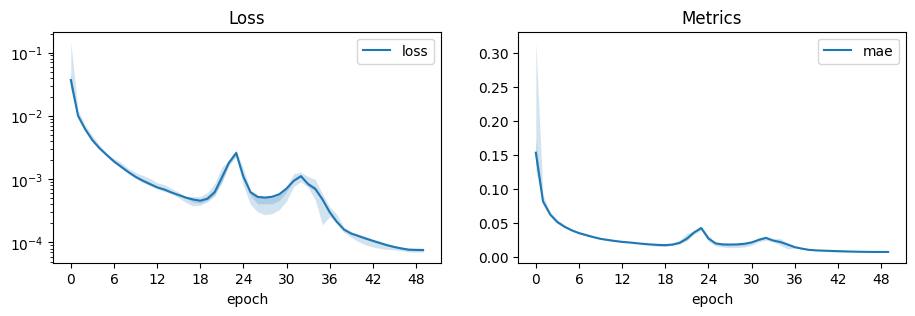

In [ ]:
tinstr.plot_train_history(history)

In [ ]:
# Spatial Resnet.
def spatial_resnet_model(min_filters=4, max_filters=4096):
  def downscale(filters, inp):
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', kernel_initializer='he_uniform')(inp)
    #x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)

    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', kernel_initializer='he_uniform')(x)
    #x = layers.BatchNormalization()(x)

    #skip = layers.Conv2D(filters, kernel_size=(1, 1), padding='same', kernel_initializer='he_uniform')(inp)
    #skip = layers.AveragePooling2D(pool_size=(2, 2))(skip)
    #x = layers.Add()([x, skip])

    skip = layers.AveragePooling2D(pool_size=(2, 2))(inp)
    spatial = CoordGrid2D()(skip)
    x = layers.Concatenate()([x, skip, spatial])
    x = layers.Conv2D(filters, kernel_size=(1, 1), padding='same', kernel_initializer='he_uniform')(x)

    x = layers.Activation('relu')(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  # 149x149x1 -> 1x1x2
  filters = min_filters
  x = downscale(min(filters*1, max_filters), x)   # 74x74x4
  x = downscale(min(filters*2, max_filters), x)   # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x)  # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

spatial_resnet_model().summary()

Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_37      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_405 (Conv2D) │ (None, 149, 149,  │         40 │ input_layer_37[0… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_200      │ (None, 149, 149,  │          0 │ conv2d_405[0][0]  │
│ (Activation)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_122   │ (None, 74, 74, 4) │          0 │ activation_200[0… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d_… │ (None, 74, 74, 1) │          0 │ input_layer_37[0… │
│ (AveragePooling2D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_406 (Conv2D) │ (None, 74, 74, 4) │        148 │ max_pooling2d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ coord_grid2d_23     │ (None, 74, 74, 2) │          0 │ average_pooling2… │
│ (CoordGrid2D)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_127     │ (None, 74, 74, 7) │          0 │ conv2d_406[0][0], │
│ (Concatenate)       │                   │            │ average_pooling2… │
│                     │                   │            │ coord_grid2d_23[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_407 (Conv2D) │ (None, 74, 74, 4) │         32 │ concatenate_127[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_201      │ (None, 74, 74, 4) │          0 │ conv2d_407[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_408 (Conv2D) │ (None, 74, 74, 8) │        296 │ activation_201[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_202      │ (None, 74, 74, 8) │          0 │ conv2d_408[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_123   │ (None, 37, 37, 8) │          0 │ activation_202[0… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d_… │ (None, 37, 37, 4) │          0 │ activation_201[0… │
│ (AveragePooling2D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_409 (Conv2D) │ (None, 37, 37, 8) │        584 │ max_pooling2d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ coord_grid2d_24     │ (None, 37, 37, 2) │          0 │ average_pooling2… │
│ (CoordGrid2D)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_128     │ (None, 37, 37,    │          0 │ conv2d_409[0][0], │
│ (Concatenate)       │ 14)               │            │ average_pooling2… │
│                     │                   │            │ coord_grid2d_24[… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 657,398 (2.51 MB)

 Trainable params: 657,398 (2.51 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = spatial_resnet_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 5.95s/epoch: loss: 0.0019  mae: 0.0335  
Epoch    10 - 285.48ms/epoch: loss: 0.0005  mae: 0.0177  
Epoch    15 - 285.75ms/epoch: loss: 0.0003  mae: 0.0132  
Epoch    20 - 288.69ms/epoch: loss: 0.0004  mae: 0.0158  
Epoch    25 - 387.23ms/epoch: loss: 0.0002  mae: 0.0115  
Epoch    30 - 293.27ms/epoch: loss: 0.0001  mae: 0.0098  
Epoch    35 - 286.35ms/epoch: loss: 0.0008  mae: 0.0226  
Epoch    40 - 285.57ms/epoch: loss: 0.0005  mae: 0.0182  
Epoch    45 - 281.80ms/epoch: loss: 0.0002  mae: 0.0111  
Epoch    50 - 287.22ms/epoch: loss: 0.0003  mae: 0.0144  
Total training time: 43.2 sec


### Expected Coordinates
This model tries to use the "expected coordinates" idea, where semantic features are treated as attention and used to soft-select into the spatial grid. This model also takes some learnings and observations from earlier attempts:
* Spatial channels are kept separate from feature channels
* Feature channels have meaning and gradients via their soft-selection over spatial coords during downscaling operation
* Can optionally add coordinate only only once at the start or accumulate channels and combine via weighted sum at the end.

Problems:
* Very poor selective contrast in earlier layers leads to bland mean-centred coordinates.

In [ ]:
# With explicit tracking of position info
# - "Expected Coordinates" model, with various configurable options
# - Runs two parallel streams of data: features and spatial coords
# - Features are passed through like for any typical CNN
# - Spatials are softmax-selected during pooling based on the features.
def expectedcoord_model(min_features=4, max_features=4096, always_add_coords=True, global_coords=False):
  """
  Args:
    - always_add_coords - whether to always add a new freshly populated coord grid at each block, or otherwise only at the start
    - global_coords - whether coord grids should be global (CoordGrid2D), or pool-local (StrideGrid2D)
  """
  def downscale(block_id, filters, features, spatials):
    # normal conv of semantic features
    features = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform', name=f"ft_conv2d_{block_id}a")(features)
    features = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform', name=f"ft_conv2d_{block_id}b")(features)

    # prepare spatial coords
    if spatials is None or always_add_coords:
      coords = CoordGrid2D(name=f"sp_coordgrid2d_{block_id}")(features) if global_coords else StrideGrid2D(name=f"sp_stridegrid2d_{block_id}")(features)
      if spatials is None:
        spatials = coords
      else:
        spatials = layers.Concatenate(name=f"sp_concat_{block_id}")([spatials, coords])

    # prepare spatial attention
    # - pointwise-conv to convert to appropriate number of channels for spatial selection
    # - plus also keeps spatial-attention independent from normal features so normal features can be conveyed through blocks more easily
    # - linear activation function as this will be fed into softmax, so we want negatives
    spatial_channels = spatials.shape[-1]
    attention = layers.Conv2D(spatial_channels, kernel_size=(1, 1), kernel_initializer='normal', name=f"attn_conv2d_{block_id}")(features)

    # downsampling
    # - normal max-pool for semantic features
    # - softmax-weighted mean for coords
    downsampled_features = layers.MaxPooling2D(pool_size=(2, 2), name=f"ft_maxpool2d_{block_id}")(features)
    downsampled_spatials = AttentionPool2D(pool_size=(2, 2), name=f"sp_attnpool2d_{block_id}")(attention, spatials)

    return downsampled_features, downsampled_spatials

  input = tf.keras.Input(shape=(149, 149, 1), name="input")
  features, spatials = input, None
  filters = min_features

  features, spatials = downscale(1, min(filters * 1, max_features), features, spatials)  # 74x74x4 + 74x74x2
  features, spatials = downscale(2, min(filters * 2, max_features), features, spatials)  # 37x37x8 + 37x37x4
  features, spatials = downscale(3, min(filters * 4, max_features), features, spatials)  # 18x18x16 + 18x18x6
  features, spatials = downscale(4, min(filters * 8, max_features), features, spatials)  # 9x9x32 + 9x9x8
  features, spatials = downscale(5, min(filters * 16, max_features), features, spatials) # 4x4x64 + 4x4x10
  features, spatials = downscale(6, min(filters * 32, max_features), features, spatials) # 2x2x128 + 2x2x12
  features, spatials = downscale(7, min(filters * 32, max_features), features, spatials) # 1x1x128 + 1x1x14  -- or 1x1x2 if not adding new coords each time
  out = layers.Flatten(name="out_flatten")(spatials)

  # combine spatials
  # - these are like multi-resolution coords that can now be merged via a simple linear combination
  if always_add_coords:
    out = layers.Dense(2, use_bias=False, kernel_initializer='normal', name="out_dense")(out)

  return tf.keras.Model(inputs=input, outputs=out)

expectedcoord_model().summary()

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 149, 149,  │          0 │ -                 │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_1a        │ (None, 149, 149,  │         40 │ input[0][0]       │
│ (Conv2D)            │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_1b        │ (None, 149, 149,  │        148 │ ft_conv2d_1a[0][… │
│ (Conv2D)            │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_maxpool2d_1      │ (None, 74, 74, 4) │          0 │ ft_conv2d_1b[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_2a        │ (None, 74, 74, 8) │        296 │ ft_maxpool2d_1[0… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_2b        │ (None, 74, 74, 8) │        584 │ ft_conv2d_2a[0][… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_maxpool2d_2      │ (None, 37, 37, 8) │          0 │ ft_conv2d_2b[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_3a        │ (None, 37, 37,    │      1,168 │ ft_maxpool2d_2[0… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_3b        │ (None, 37, 37,    │      2,320 │ ft_conv2d_3a[0][… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_maxpool2d_3      │ (None, 18, 18,    │          0 │ ft_conv2d_3b[0][… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_4a        │ (None, 18, 18,    │      4,640 │ ft_maxpool2d_3[0… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ attn_conv2d_1       │ (None, 149, 149,  │         10 │ ft_conv2d_1b[0][… │
│ (Conv2D)            │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sp_stridegrid2d_1   │ (None, 149, 149,  │          0 │ ft_conv2d_1b[0][… │
│ (StrideGrid2D)      │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_4b        │ (None, 18, 18,    │      9,248 │ ft_conv2d_4a[0][… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sp_attnpool2d_1     │ (None, 74, 74, 2) │          0 │ attn_conv2d_1[0]… │
│ (AttentionPool2D)   │                   │            │ sp_stridegrid2d_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sp_stridegrid2d_2   │ (None, 74, 74, 2) │          0 │ ft_conv2d_2b[0][… │
│ (StrideGrid2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_maxpool2d_4      │ (None, 9, 9, 32)  │          0 │ ft_conv2d_4b[0][

 Total params: 594,920 (2.27 MB)

 Trainable params: 594,920 (2.27 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = expectedcoord_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=250, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch    25 - 1.43s/epoch: loss: 0.0050  mae: 0.0567  
Epoch    50 - 501.60ms/epoch: loss: 0.0008  mae: 0.0219  
Epoch    75 - 504.25ms/epoch: loss: 0.0006  mae: 0.0188  
Epoch   100 - 510.26ms/epoch: loss: 0.0004  mae: 0.0155  
Epoch   125 - 499.78ms/epoch: loss: 0.0006  mae: 0.0196  
Epoch   150 - 496.08ms/epoch: loss: 0.0005  mae: 0.0169  
Epoch   175 - 507.99ms/epoch: loss: 0.0006  mae: 0.0191  
Epoch   200 - 495.54ms/epoch: loss: 0.0011  mae: 0.0261  
Epoch   225 - 511.81ms/epoch: loss: 0.0003  mae: 0.0143  
Epoch   250 - 499.37ms/epoch: loss: 0.0007  mae: 0.0193  
Total training time: 148.8 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


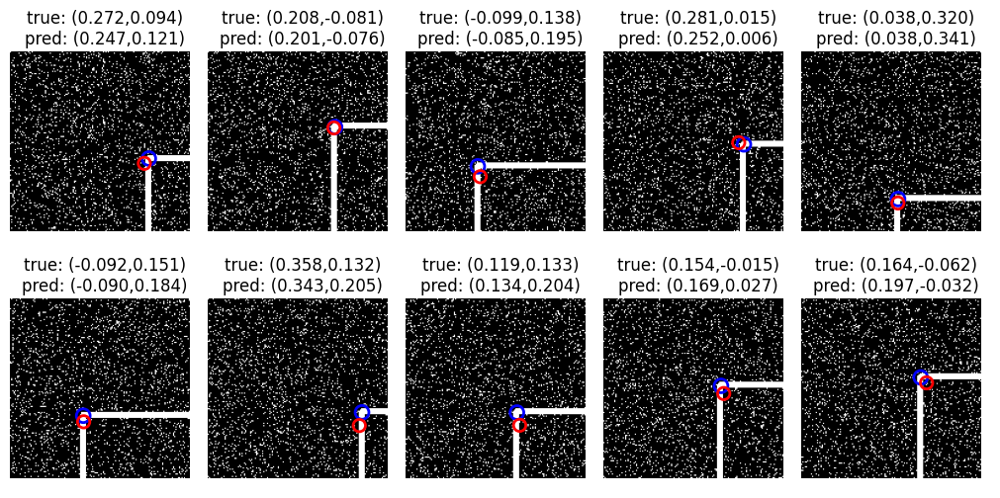

In [ ]:
plot_dataset(train_data, model)

prediction:      [[0.24698669 0.12108579]]
all layers:      [TensorShape([1, 149, 149, 1]), TensorShape([1, 149, 149, 4]), TensorShape([1, 149, 149, 4]), TensorShape([1, 74, 74, 4]), TensorShape([1, 74, 74, 8]), TensorShape([1, 74, 74, 8]), TensorShape([1, 37, 37, 8]), TensorShape([1, 37, 37, 16]), TensorShape([1, 37, 37, 16]), TensorShape([1, 18, 18, 16]), TensorShape([1, 18, 18, 32]), TensorShape([1, 149, 149, 2]), TensorShape([1, 149, 149, 2]), TensorShape([1, 18, 18, 32]), TensorShape([1, 74, 74, 2]), TensorShape([1, 74, 74, 2]), TensorShape([1, 9, 9, 32]), TensorShape([1, 74, 74, 4]), TensorShape([1, 74, 74, 4]), TensorShape([1, 9, 9, 64]), TensorShape([1, 37, 37, 4]), TensorShape([1, 37, 37, 2]), TensorShape([1, 9, 9, 64]), TensorShape([1, 37, 37, 6]), TensorShape([1, 37, 37, 6]), TensorShape([1, 4, 4, 64]), TensorShape([1, 18, 18, 6]), TensorShape([1, 18, 18, 2]), TensorShape([1, 4, 4, 128]), TensorShape([1, 18, 18, 8]), TensorShape([1, 18, 18, 8]), TensorShape([1, 4, 4, 128]), 

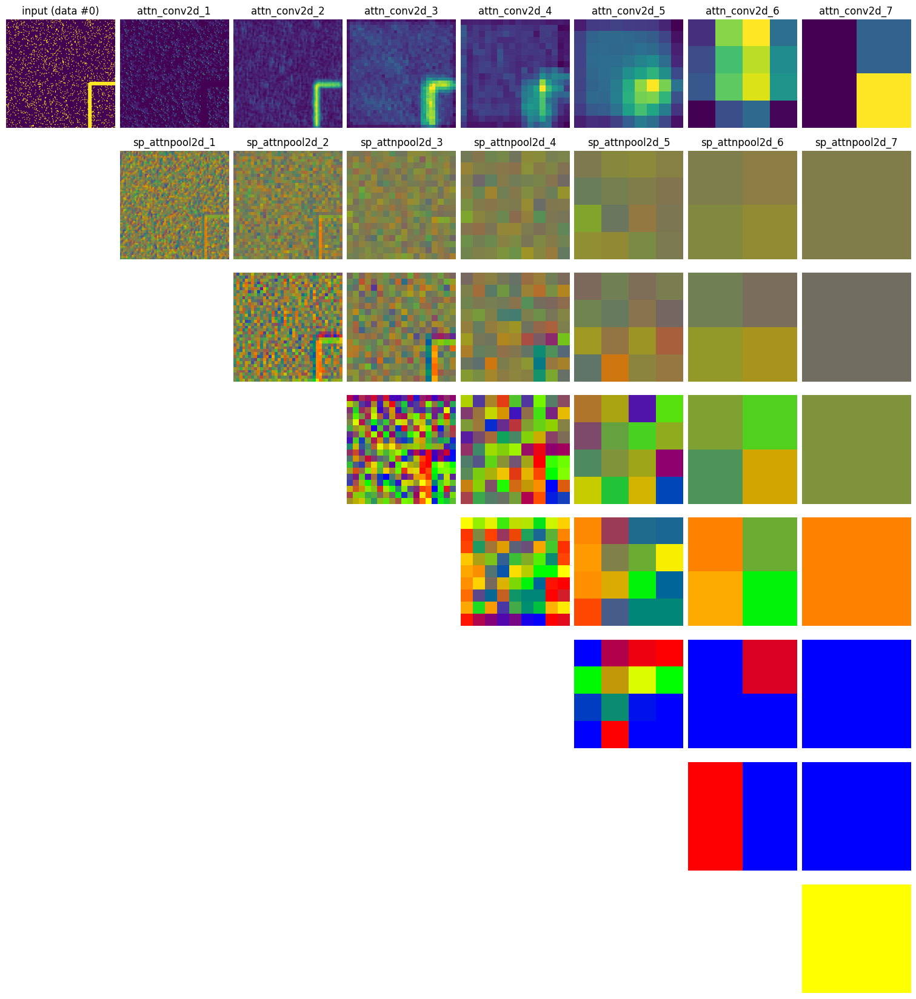

In [ ]:
def plot_spatial_layers(model, dataset, feature_filter=r'attn_conv2d_.*', coord_filter=r'sp_attnpool2d_.*', num=1):
    # prepare model
    monitoring_model = tf.keras.Model(
        inputs=tinstr._original_inputs(model),
        outputs=[model.outputs] + [layer.output for layer in model.layers])

    # do prediction
    dataset = dataset.take(num).batch(num)
    data = next(iter(dataset))[0]
    out = monitoring_model(data)
    prediction = out[0][0]
    layer_outputs = out[1:]
    print(f"prediction:      {prediction}")
    print(f"all layers:      {[t.shape for t in layer_outputs]}")
    print(f"filtered layers: {[layer_outputs[l_idx].shape for l_idx in layer_indices]}")

    feature_layer_indices = index_layers_by_name_pattern(model, feature_filter)
    coord_layer_indices = index_layers_by_name_pattern(model, coord_filter)
    max_channels = max([layer_outputs[l_idx].shape[-1] for l_idx in coord_layer_indices])

    cols = 1 + max(len(feature_layer_indices), len(coord_layer_indices))
    rows = num * (1+max_channels)
    plt.figure(figsize=(15, 2 * rows), layout='constrained')

    for idx in range(num):
        row = idx * (1+max_channels)
        col = 0
        plt.subplot(rows, cols, 1 + (row * cols) + col)
        plt.title(f"input (data #{idx})")
        plt.imshow(data[idx, :, :, 0])
        plt.axis('off')

        # feature layers
        col = 0
        for l_idx in feature_layer_indices:
            layer = model.layers[l_idx]
            layer_data = layer_outputs[l_idx]
            col += 1
            plt.subplot(rows, cols, 1 + (row * cols) + col)
            plt.title(f"{layer.name}")
            plt.imshow(flatten_channels(layer_data[idx], reduction='pos-norm'))
            plt.axis('off')

        # coordinate layers
        col = 0
        for l_idx in layer_indices:
            layer = model.layers[l_idx]
            layer_data = layer_outputs[l_idx]
            col += 1

            for channel in range(0, layer_data.shape[-1], 2):
                this_row = row + 1 + channel//2
                plt.subplot(rows, cols, 1 + (this_row * cols) + col)
                if channel == 0:
                    plt.title(f"{layer.name}")
                plt.imshow(coords_to_rgb(layer_data[idx, :, :, channel:(channel+2)]))
                plt.axis('off')

plot_spatial_layers(model, train_data)

In [ ]:
model_output, layer_outputs = get_layer_outputs(model, train_data)
layer_indices = index_layers_by_name_pattern(model, r'attention_pool2d_.*')

## Multi-spatial Features
The following model variants all try to construct multi-resolution features at the original image resolution.

The general principle is to eschew explicit spatial representation, instead using the _location_ of semantic features to identify coordinates.

In [149]:
class MeanCoordError(tf.keras.metrics.Metric):
  """
  Automatically copes with different output representations to make my life easier.
  Computes the distance between true and predicted coordinates, in pixels, possibly after conversion
  from whatever output representation the model uses (eg: heatmap).
  """
  def __init__(self, encoding, name="mce", **kwargs):
    """
    Args:
      encoding = one of:
        "xy" - model outputs (B,2) of (x,y) coordinates in range +/- 0.5 as fraction of image width/height.
        "heatmap-peak" - model outputs (B,H,W,1) of heatmap, where 3x3 grid surrounding peak is used as weighted mean of pixel coordinates
    """
    super().__init__(name=name, **kwargs)
    self.encoding = encoding
    self.total = self.add_weight(name="total", initializer="zeros")
    self.count = self.add_weight(name="count", initializer="zeros")

  def update_state(self, y_true, y_pred, sample_weight=None):
    if self.encoding == "xy":
      coord_true = y_true  # (B, 2)
      coord_pred = y_pred  # (B, 2)
    elif self.encoding == "heatmap-peak":
      coord_true = weighted_peak_coordinates(y_true, system='unit-scale')  # (B, 2)
      coord_pred = weighted_peak_coordinates(y_pred, system='unit-scale')  # (B, 2)
    else:
      raise ValueError(f"Unrecognised output encoding: {self.encoding}")

    # calculate distances
    coord_errors = tf.square(coord_true - coord_pred)             # (B,2)
    coord_errors = tf.sqrt(tf.reduce_sum(coord_errors, axis=-1))  # (B,)

    # convert to pixels
    # (assumes 149x149)
    coord_errors = coord_errors * 149

    self.total.assign_add(tf.reduce_sum(coord_errors))
    self.count.assign_add(tf.cast(tf.size(coord_errors), tf.float32))

  def result(self):
      return self.total / self.count

  def reset_states(self):
      self.total.assign(0.0)
      self.count.assign(0.0)

# check with symbolic tensors
# - can't pass tf.keras.Input() to metric, so validate via dummy model instead
def test_mean_coord_error():
  inp = tf.keras.Input(shape=(149,149))
  out = layers.Reshape((149, 149, 1))(inp)
  model = tf.keras.Model(inp, out)
  model.compile(optimizer="adam", loss="mse", metrics=[MeanCoordError("heatmap-peak")])
  x = tf.random.normal((32,149,149))
  y = tf.random.normal((32,149,149,1))
  model.train_on_batch(x, y)  # Internally calls metric.update_state with symbolic tensors
test_mean_coord_error()

# check with actual values
y_true = tf.stack([generate_heatmap_image(50,50)], axis=0)
y_pred = tf.stack([generate_heatmap_image(110,10)], axis=0)
metric = MeanCoordError("heatmap-peak")
metric.update_state(y_true, y_pred)
print(f"error: {metric.result()}")

y_true = (np.array([50.,50.]) - 149//2) / 149
y_pred = (np.array([110.,10.]) - 149//2) / 149
metric = MeanCoordError("xy")
metric.update_state(y_true, y_pred)
print(f"error: {metric.result()}")

error: 72.11103057861328
error: 72.11102294921875


dist2: (1, 149, 149, 1) - 0.0..19208.0, weights: (1, 149, 149, 1)
loss: [0.00356612]
dist2: (1, 149, 149, 1) - 0.0..31144.0, weights: (1, 149, 149, 1)
loss: [0.00356612]


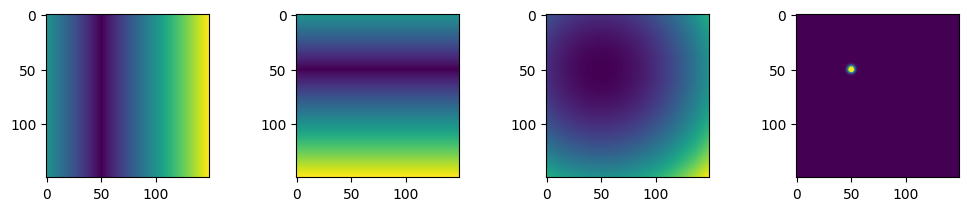

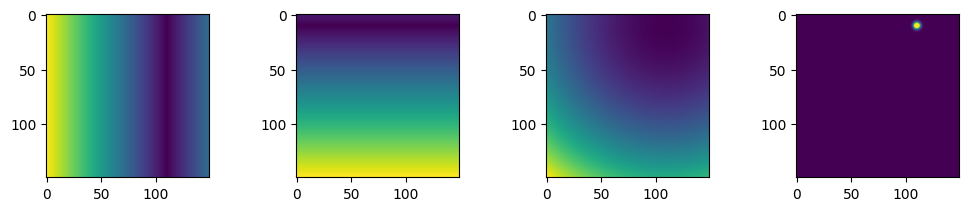

In [110]:
class _PeakWeightedLoss(tf.keras.losses.Loss):
  """
  Proto-loss class to be a part of a larger loss class via composition.

  Computes loss only near a peak (target or predicted). Applies a gaussian distributed weighting
  to all pixels, but tightly focused on the target peak.
  """
  def __init__(self, peak_source, sigma=2.0, disc_radius=None, debug=False):
    # Default disc radius found through trial and error to work for small and large sigmas.
    # With sigma=2.0, this pulls in just a little more than the 3x3 grid at flat weighting.
    super().__init__()
    if peak_source not in ['y_true', 'y_pred']:
      raise ValueError(f"Invalid peak_source: {peak_source}")
    self.peak_source = peak_source
    self.sigma = sigma
    self.disc_radius = tf.sqrt(sigma)*1.5 if disc_radius is None else disc_radius
    self.debug = debug

  def call(self, y_true, y_pred):
    """
    Args:
      y_true/y_pred - (B, H, W, C)
    Returns:
      (B,) - loss for each sample in batch
    """
    B, H, W, C = tf.unstack(tf.shape(y_true))

    # identify peak coordinates from source
    peak_source = y_true if self.peak_source == "y_true" else y_pred
    x_peaks = tf.reduce_max(peak_source, axis=1)                 # (B, W, C)
    x_peaks = tf.argmax(x_peaks, axis=1, output_type=tf.int32)   # (B, C)
    y_peaks = tf.reduce_max(peak_source, axis=2)                 # (B, H, C)
    y_peaks = tf.argmax(y_peaks, axis=1, output_type=tf.int32)   # (B, C)
    x_peaks = tf.reshape(x_peaks, [B, 1, 1, C])                  # (B, 1, 1, C)
    y_peaks = tf.reshape(y_peaks, [B, 1, 1, C])                  # (B, 1, 1, C)

    # populate coordinate grid
    grid_x, grid_y = tf.meshgrid(tf.range(W), tf.range(H))  # (H, W)
    grid_x = tf.tile(tf.reshape(grid_x, [1, H, W, 1]), [B, 1, 1, C])  # (B, H, W, C)
    grid_y = tf.tile(tf.reshape(grid_y, [1, H, W, 1]), [B, 1, 1, C])  # (B, H, W, C)

    # compute square-distance grid
    dist_x = grid_x - x_peaks
    dist_y = grid_y - y_peaks
    dist2 = tf.cast(dist_x**2 + dist_y**2, tf.float32)  # (B, H, W, C)

    # compute weights
    #  - compute as gaussian of square-dist
    #  - then push gaussian up so that it's 1.0 @ disc_radius, and clipped in the middle to 1.0
    #  - total: max between them, then normalized as weights
    #  - this ensures that the existing gaussian shape of the 3x3 patch in y_true is given 100% equal weights across,
    #    but that there's also a little bubble around it pushing those values towards zero, while retaining
    #    smooth transitions.
    weights = tf.exp(-dist2/(2*self.sigma**2))                     # (B, H, W, C) in range 0.0 .. 1.0
    edge = tf.exp(-self.disc_radius**2/(2*self.sigma**2))
    weights = tf.clip_by_value(weights / edge, 0.0, 1.0)
    scale = tf.reduce_sum(weights, axis=[1,2], keepdims=True)      # (B, 1, 1, C)
    weights = weights / scale                                      # (B, H, W, C) normalised to sum to 1.0 for each (B, C)

    # DEBUG MODE - plot and log workings
    if self.debug:
      print(f"dist2: {dist2.shape} - {np.min(dist2)}..{np.max(dist2)}, weights: {weights.shape}")
      plt.figure(figsize=(10, 2), layout='constrained')
      plt.subplot(1,4,1)
      plt.imshow(tf.abs(dist_x[0]))
      plt.subplot(1,4,2)
      plt.imshow(tf.abs(dist_y[0]))
      plt.subplot(1,4,3)
      plt.imshow(dist2[0])
      plt.subplot(1,4,4)
      plt.imshow(weights[0])

    # calculate weighted MSE loss
    # - note: weights already normalised to computed weighted mean, so use sum to calculate mean
    error = tf.square(y_true - y_pred)  # (B, H, W, C)
    loss = tf.reduce_sum(error * weights, axis=[1,2,3])  # (B,)
    return loss

y_true = tf.stack([generate_heatmap_image(50,50)], axis=0)
#y_pred = tf.zeros_like(y_true)
y_pred = tf.stack([generate_heatmap_image(110,10)], axis=0)
loss = _PeakWeightedLoss("y_true", sigma=2.0, debug=True).call(y_true, y_pred)
print(f"loss: {loss}")

loss = _PeakWeightedLoss("y_pred", sigma=2.0, debug=True).call(y_true, y_pred)
print(f"loss: {loss}")

In [113]:
class HeatmapPeakCoordLoss(tf.keras.losses.Loss):
  """
  Loss calculated through three weighted components:
  - global MSE
  - MSE of area near true peak
  - MSE of area near predicted peak
  """
  def __init__(self, name="hpc_loss", component_weights=None, sigma=2.0, disc_radius=None):
    """
    Args:
      component_weights - 3-array of weights of the three loss components (will be normalized to sum to 1.0)
    """
    # Default disc radius found through trial and error to work for small and large sigmas.
    # With sigma=2.0, this pulls in just a little more than the 3x3 grid at flat weighting.
    super().__init__(name=name)
    if component_weights is not None and np.shape(component_weights) != (3,):
      raise ValueError(f"Wrong shape for component_weights: {component_weights}")
    if component_weights is None:
      component_weights = [1.0, 1.0, 1.0]
    component_weights = tf.constant(component_weights, dtype=tf.float32)
    self.component_weights = component_weights / tf.reduce_sum(component_weights)

    self.true_peak_losser = _PeakWeightedLoss("y_true", sigma=sigma, disc_radius=disc_radius)
    self.pred_peak_losser = _PeakWeightedLoss("y_pred", sigma=sigma, disc_radius=disc_radius)

  def call(self, y_true, y_pred):
    """
    Args:
      y_true/y_pred - (B, H, W, C)
    Returns:
      (B,) - loss for each sample in batch
    """
    image_wide_loss = tf.reduce_mean(tf.square(y_true - y_pred), axis=[1,2,3])   # (B,)
    true_peak_loss = self.true_peak_losser(y_true, y_pred)
    pred_peak_loss = self.pred_peak_losser(y_true, y_pred)

    return self.component_weights[0]*image_wide_loss +\
      self.component_weights[1]*true_peak_loss +\
      self.component_weights[2]*pred_peak_loss

y_true = tf.stack([generate_heatmap_image(50,50)], axis=0)
#y_pred = tf.zeros_like(y_true)
y_pred = tf.stack([generate_heatmap_image(50.5,50.5)], axis=0)
loss = HeatmapPeakCoordLoss().call(y_true, y_pred)
print(f"loss: {loss}")


loss: [0.00185074]


In [55]:
# Multi-scale features, concatenated and "fused" at end, output as a 1-ch heatmap
# note: turns out that this model is very prone to full neuron death upon initialization,
#    within the last single-channel layer. So it must not use ReLU.
def multiscale_features_and_heatmap(num_filters=16):
  input = tf.keras.Input(shape=(149, 149, 1))
  target_size = (149, 149)
  x = input

  # Downscale features
  # 149x149 -> 74x74 -> 37x37 -> 18x18 -> 9x9 -> 4x4 -> 2x2 -> (1x1, dropped)
  features = []
  for _ in range(7):
    x = layers.Conv2D(num_filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    features.append(x)
    x = layers.MaxPooling2D(pool_size=2)(x)

  # Upsample all feature maps to original resolution
  upsampled_features = []
  for feat in features:
    up = layers.Lambda(lambda t: tf.image.resize(t, size=target_size, method='bilinear'))(feat)
    up = layers.Conv2D(num_filters, 1, padding='same', activation='relu')(up)
    upsampled_features.append(up)

  # Fuse all feature maps
  fused = layers.Concatenate()(upsampled_features)
  fused = layers.Conv2D(num_filters, 3, padding='same', activation='relu', kernel_initializer='he_uniform')(fused)
  fused = layers.Conv2D(num_filters, 3, padding='same', activation='relu', kernel_initializer='he_uniform')(fused)

  # Compute final 1-ch heatmap
  # - note: since we're now dropping to a single channel, the likelihood of the whole layer being dead is very high, but we must not use relu here
  fused = layers.Conv2D(1, 3, padding='same', kernel_initializer='he_uniform')(fused)

  return tf.keras.Model(inputs=input, outputs=fused)

multiscale_features_and_heatmap().summary()

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_153 (Conv2D) │ (None, 149, 149,  │        160 │ input_layer_14[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_63    │ (None, 74, 74,    │          0 │ conv2d_153[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_154 (Conv2D) │ (None, 74, 74,    │      2,320 │ max_pooling2d_63… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_64    │ (None, 37, 37,    │          0 │ conv2d_154[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_155 (Conv2D) │ (None, 37, 37,    │      2,320 │ max_pooling2d_64… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_65    │ (None, 18, 18,    │          0 │ conv2d_155[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_156 (Conv2D) │ (None, 18, 18,    │      2,320 │ max_pooling2d_65… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_66    │ (None, 9, 9, 16)  │          0 │ conv2d_156[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_157 (Conv2D) │ (None, 9, 9, 16)  │      2,320 │ max_pooling2d_66… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_67    │ (None, 4, 4, 16)  │          0 │ conv2d_157[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_158 (Conv2D) │ (None, 4, 4, 16)  │      2,320 │ max_pooling2d_67… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_68    │ (None, 2, 2, 16)  │          0 │ conv2d_158[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_159 (Conv2D) │ (None, 2, 2, 16)  │      2,320 │ max_pooling2d_68… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_63 (Lambda)  │ (None, 149, 149,  │          0 │ conv2d_153[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_64 (Lambda)  │ (None, 149, 149,  │          0 │ conv2d_154[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_65 (Lambda)  │ (None, 149, 149,  │          0 │ conv2d_155[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_66 (Lambda)  │ (None, 149, 149,  │          0 │ conv2d_156[0][0]

 Total params: 34,593 (135.13 KB)

 Trainable params: 34,593 (135.13 KB)

 Non-trainable params: 0 (0.00 B)

In [153]:
# Using simple naive MSE loss against entire feature map
# - Fails because there's a massive skew towards the negative case
dataset = heatmap_train_data.batch(32)
model = multiscale_features_and_heatmap()
model.compile(optimizer='adam', loss='mse', metrics=['mae', MeanCoordError("heatmap-peak")])
history = model.fit(dataset, epochs=10, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     1 - 19.53s/epoch: loss: 0.0872  mae: 0.1734  mce: 66.8385  
Epoch     2 - 3.43s/epoch: loss: 0.0006  mae: 0.0136  mce: 60.7060  
Epoch     3 - 3.33s/epoch: loss: 0.0000  mae: 0.0012  mce: 266.8111  
Epoch     4 - 3.36s/epoch: loss: 0.0000  mae: 0.0004  mce: 94.5954  
Epoch     5 - 3.38s/epoch: loss: 0.0000  mae: 0.0002  mce: 94.5709  
Epoch     6 - 3.39s/epoch: loss: 0.0000  mae: 0.0002  mce: 94.3453  
Epoch     7 - 3.39s/epoch: loss: 0.0000  mae: 0.0002  mce: 96.0335  
Epoch     8 - 3.44s/epoch: loss: 0.0000  mae: 0.0002  mce: 240.4659  
Epoch     9 - 3.42s/epoch: loss: 0.0000  mae: 0.0002  mce: 100.3842  
Epoch    10 - 3.43s/epoch: loss: 0.0000  mae: 0.0002  mce: 100.8311  
Total training time: 50.1 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


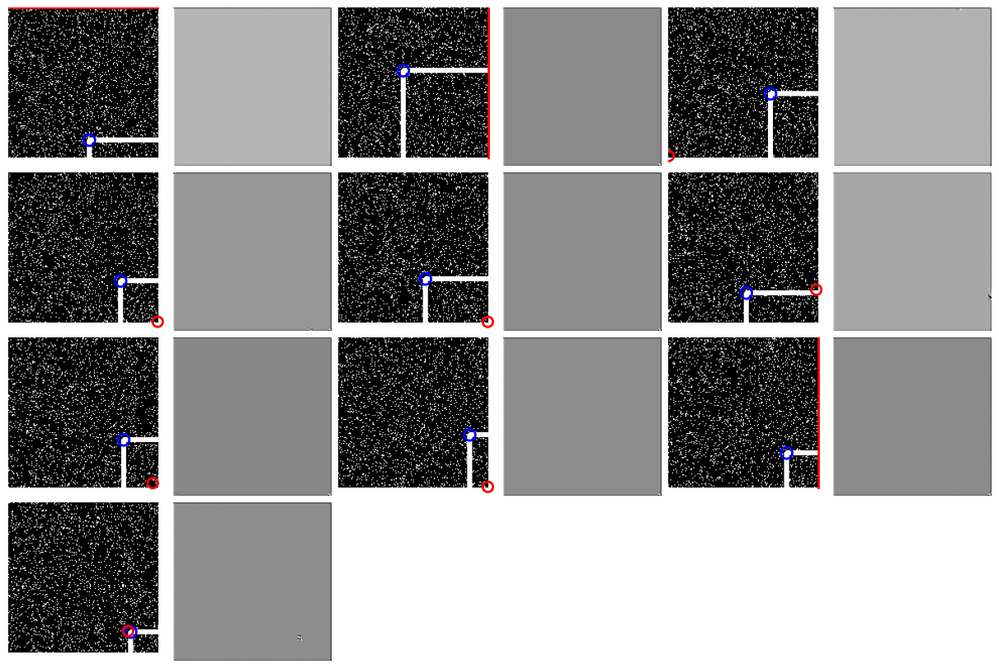

In [154]:
plot_dataset(heatmap_train_data, model, show_heatmap=True)

In [151]:
# Using variation of HeatmapPeakCoordLoss that primarily considers only the ground-truth peak,
# but with a slightly enlarged bubble of interest around it, and with a long tail of near-zero
# weighting on the rest of the image.
# Amazingly, with component_weights=[0.0, 1.0, 0.0], sometimes it seems that the sum of the near-zero weighting across the majority of the grid is
#  sufficient to apply training pressure to reduce false-positive peaks. However that is not reliable, and depends
#  on initialization.
# Even with component_weights=[1.0, 1.0, 0.0], it still can fail sometimes because the global MSE has such a strong averaging effect that it can't keep false-positives low.

dataset = heatmap_train_data.batch(32)
model = multiscale_features_and_heatmap()
model.compile(optimizer='adam', loss=HeatmapPeakCoordLoss(), metrics=['mae', MeanCoordError("heatmap-peak")])
history = model.fit(dataset, epochs=10, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     1 - 21.51s/epoch: loss: 0.0590  mae: 0.1123  mce: 75.6649  
Epoch     2 - 3.47s/epoch: loss: 0.0028  mae: 0.0282  mce: 67.1221  
Epoch     3 - 3.38s/epoch: loss: 0.0019  mae: 0.0212  mce: 64.6296  
Epoch     4 - 3.42s/epoch: loss: 0.0016  mae: 0.0184  mce: 57.9700  
Epoch     5 - 3.41s/epoch: loss: 0.0014  mae: 0.0165  mce: 40.5609  
Epoch     6 - 3.42s/epoch: loss: 0.0013  mae: 0.0153  mce: 22.2942  
Epoch     7 - 3.45s/epoch: loss: 0.0011  mae: 0.0145  mce: 7.6850  
Epoch     8 - 3.48s/epoch: loss: 0.0010  mae: 0.0141  mce: 2.5704  
Epoch     9 - 3.49s/epoch: loss: 0.0008  mae: 0.0140  mce: 1.4059  
Epoch    10 - 3.48s/epoch: loss: 0.0007  mae: 0.0139  mce: 0.6908  
Total training time: 52.5 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


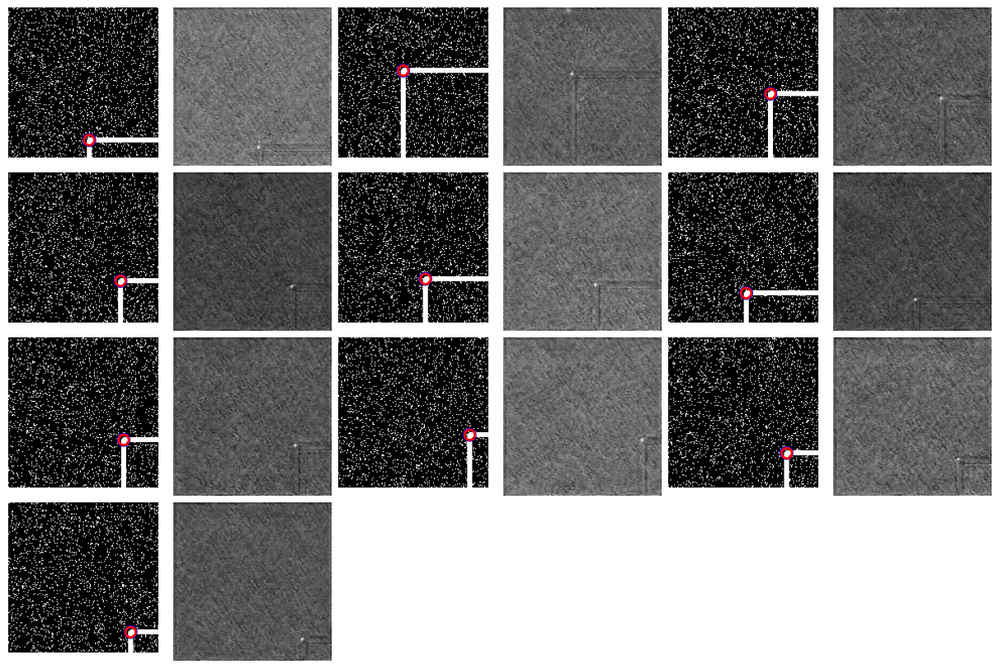

In [152]:
plot_dataset(heatmap_train_data, model, show_heatmap=True)

In [117]:
model_output, layer_outputs = get_layer_outputs(model, train_data, num=10)
print(f"layer_outputs ({len(layer_outputs)}): {[l.shape for l in layer_outputs]}")

layer_outputs (32): [TensorShape([10, 149, 149, 1]), TensorShape([10, 149, 149, 16]), TensorShape([10, 74, 74, 16]), TensorShape([10, 74, 74, 16]), TensorShape([10, 37, 37, 16]), TensorShape([10, 37, 37, 16]), TensorShape([10, 18, 18, 16]), TensorShape([10, 18, 18, 16]), TensorShape([10, 9, 9, 16]), TensorShape([10, 9, 9, 16]), TensorShape([10, 4, 4, 16]), TensorShape([10, 4, 4, 16]), TensorShape([10, 2, 2, 16]), TensorShape([10, 2, 2, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 112]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149

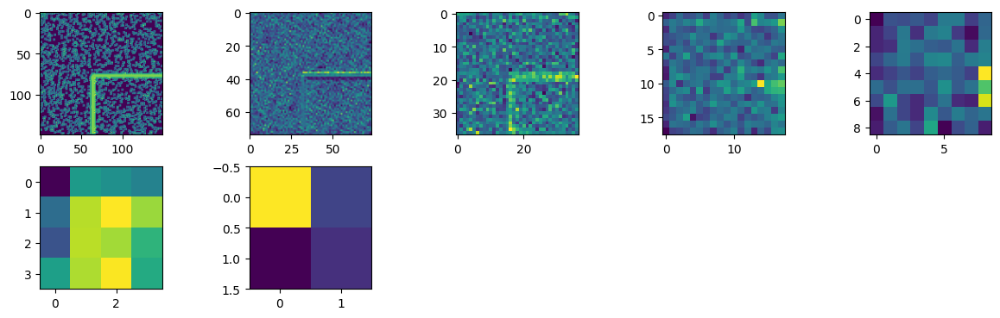

In [118]:
# conv2D layers at each resolution
plt.figure(figsize=(12,5), layout='constrained')
for i in range(1,13+1,2):
  plt.subplot(3, 5, i//2+1)
  plt.imshow(tf.reduce_mean(layer_outputs[i][0], axis=-1))
plt.show()

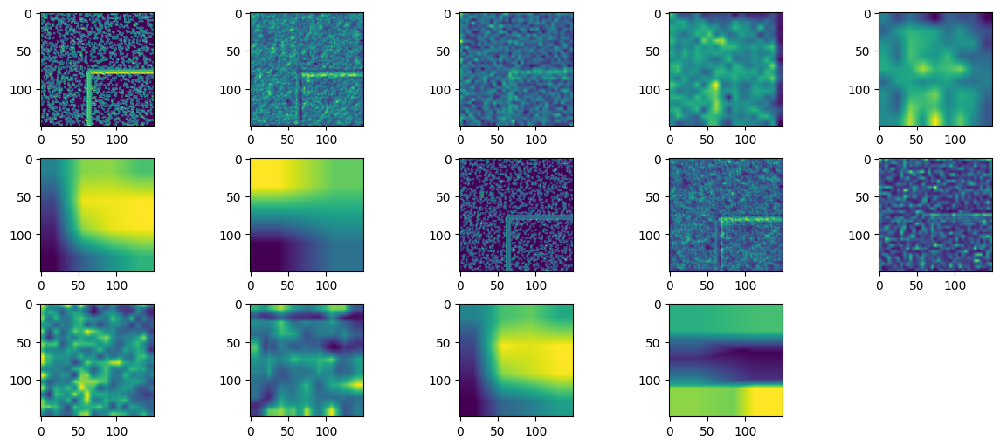

In [71]:
# upscaled multi-resolutions
plt.figure(figsize=(12,5), layout='constrained')
for i in range(14,28):
  plt.subplot(3, 5, i-14+1)
  plt.imshow(tf.reduce_mean(layer_outputs[i][0], axis=-1))
plt.show()

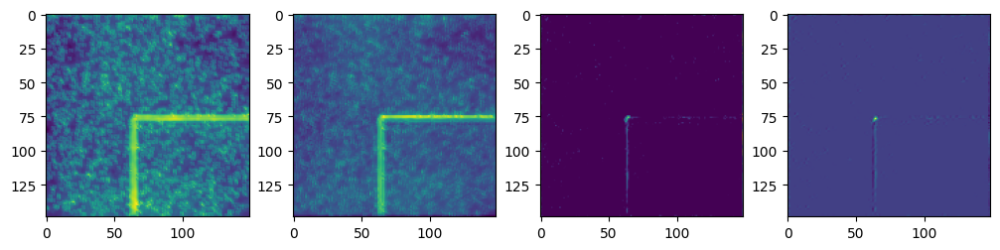

In [119]:
# final output layers
plt.figure(figsize=(12,5), layout='constrained')
for i in range(28,32):
  plt.subplot(1, 5, i-28+1)
  plt.imshow(tf.reduce_mean(layer_outputs[i][0], axis=-1))
plt.show()

### Multi-scale features generating coords

In [156]:
# Multi-scale features, concatenated and "fused" at end, output as a 1-ch heatmap
def multiscale_features_and_coords(num_filters=16):
  input = tf.keras.Input(shape=(149, 149, 1))
  target_size = (149, 149)
  x = input

  # Downscale features
  # 149x149 -> 74x74 -> 37x37 -> 18x18 -> 9x9 -> 4x4 -> 2x2 -> 1x1
  features = []
  for _ in range(7):
    x = layers.Conv2D(num_filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    features.append(x)
    x = layers.MaxPooling2D(pool_size=2)(x)

  # Upsample all feature maps to original resolution
  upsampled_features = []
  for feat in features:
    up = layers.Lambda(lambda t: tf.image.resize(t, size=target_size, method='bilinear'))(feat)
    up = layers.Conv2D(num_filters, 1, padding='same', activation='relu')(up)
    upsampled_features.append(up)

  # Fuse all feature maps
  fused = layers.Concatenate()(upsampled_features)
  fused = layers.Conv2D(num_filters, 3, padding='same', activation='relu', kernel_initializer='he_uniform')(fused)
  fused = layers.Conv2D(num_filters, 3, padding='same', activation='relu', kernel_initializer='he_uniform')(fused)

  # Compute final 1-ch heatmap and then convert to peak coordinates
  fused = layers.Conv2D(1, 3, padding='same', kernel_initializer='he_uniform')(fused)
  fused = HeatmapPeakCoord()(fused)  # (None, C=1, 2)
  fused = layers.Flatten()(fused)  # (None, 2)

  return tf.keras.Model(inputs=input, outputs=fused)

multiscale_features_and_coords().summary()

Model: "functional_46"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_45      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_510 (Conv2D) │ (None, 149, 149,  │        160 │ input_layer_45[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_210   │ (None, 74, 74,    │          0 │ conv2d_510[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_511 (Conv2D) │ (None, 74, 74,    │      2,320 │ max_pooling2d_21… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_211   │ (None, 37, 37,    │          0 │ conv2d_511[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_512 (Conv2D) │ (None, 37, 37,    │      2,320 │ max_pooling2d_21… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_212   │ (None, 18, 18,    │          0 │ conv2d_512[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_513 (Conv2D) │ (None, 18, 18,    │      2,320 │ max_pooling2d_21… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_213   │ (None, 9, 9, 16)  │          0 │ conv2d_513[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_514 (Conv2D) │ (None, 9, 9, 16)  │      2,320 │ max_pooling2d_21… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_214   │ (None, 4, 4, 16)  │          0 │ conv2d_514[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_515 (Conv2D) │ (None, 4, 4, 16)  │      2,320 │ max_pooling2d_21… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_215   │ (None, 2, 2, 16)  │          0 │ conv2d_515[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_516 (Conv2D) │ (None, 2, 2, 16)  │      2,320 │ max_pooling2d_21… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_210 (Lambda) │ (None, 149, 149,  │          0 │ conv2d_510[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_211 (Lambda) │ (None, 149, 149,  │          0 │ conv2d_511[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_212 (Lambda) │ (None, 149, 149,  │          0 │ conv2d_512[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_213 (Lambda) │ (None, 149, 149,  │          0 │ conv2d_513[0][0]

 Total params: 34,593 (135.13 KB)

 Trainable params: 34,593 (135.13 KB)

 Non-trainable params: 0 (0.00 B)

In [157]:
# This is very similar to using HeatmapPeakCoordLoss against the pred-peak only.
# It discourages false-positives, but doesn't actively encourage true-positives until it's ruled out all the other posible locations.
dataset = train_data.batch(32)
model = multiscale_features_and_coords()
model.compile(optimizer='adam', loss='mse', metrics=['mae', MeanCoordError('xy')])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 6.44s/epoch: loss: 0.0134  mae: 0.0456  mce: 10.9137  
Epoch    10 - 4.08s/epoch: loss: 0.0122  mae: 0.0612  mce: 15.3630  
Epoch    15 - 4.08s/epoch: loss: 0.0158  mae: 0.0877  mce: 22.0847  
Epoch    20 - 3.70s/epoch: loss: 0.0145  mae: 0.0853  mce: 21.3613  
Epoch    25 - 3.70s/epoch: loss: 0.0035  mae: 0.0210  mce: 5.2001  
Epoch    30 - 3.37s/epoch: loss: 0.0045  mae: 0.0180  mce: 4.2821  
Epoch    35 - 3.72s/epoch: loss: 0.0125  mae: 0.0620  mce: 14.8288  
Epoch    40 - 3.37s/epoch: loss: 0.0022  mae: 0.0123  mce: 2.9912  
Epoch    45 - 3.37s/epoch: loss: 0.0063  mae: 0.0368  mce: 8.5860  
Epoch    50 - 3.36s/epoch: loss: 0.0074  mae: 0.0338  mce: 8.9138  
Total training time: 196.0 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


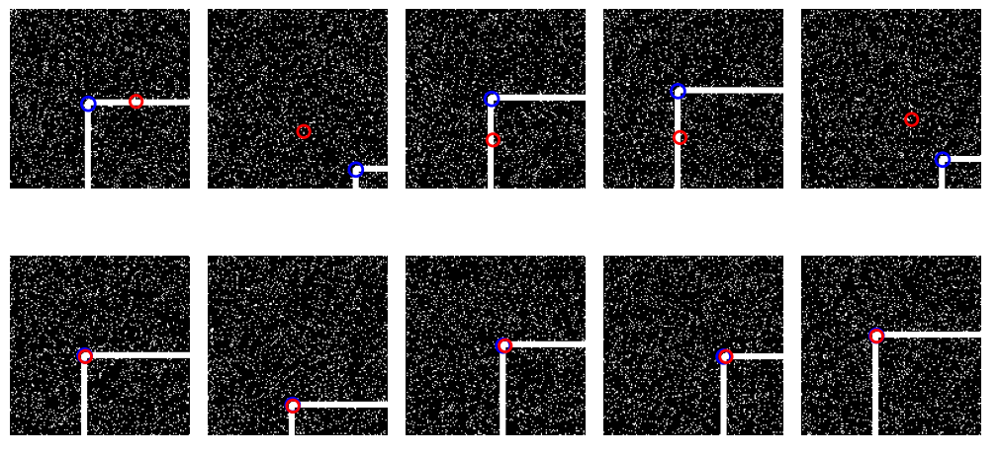

In [158]:
plot_dataset(train_data, model)

In [159]:
model_output, layer_outputs = get_layer_outputs(model, train_data, num=10)
print(f"layer_outputs ({len(layer_outputs)}): {[l.shape for l in layer_outputs]}")

layer_outputs (34): [TensorShape([10, 149, 149, 1]), TensorShape([10, 149, 149, 16]), TensorShape([10, 74, 74, 16]), TensorShape([10, 74, 74, 16]), TensorShape([10, 37, 37, 16]), TensorShape([10, 37, 37, 16]), TensorShape([10, 18, 18, 16]), TensorShape([10, 18, 18, 16]), TensorShape([10, 9, 9, 16]), TensorShape([10, 9, 9, 16]), TensorShape([10, 4, 4, 16]), TensorShape([10, 4, 4, 16]), TensorShape([10, 2, 2, 16]), TensorShape([10, 2, 2, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149, 112]), TensorShape([10, 149, 149, 16]), TensorShape([10, 149, 149

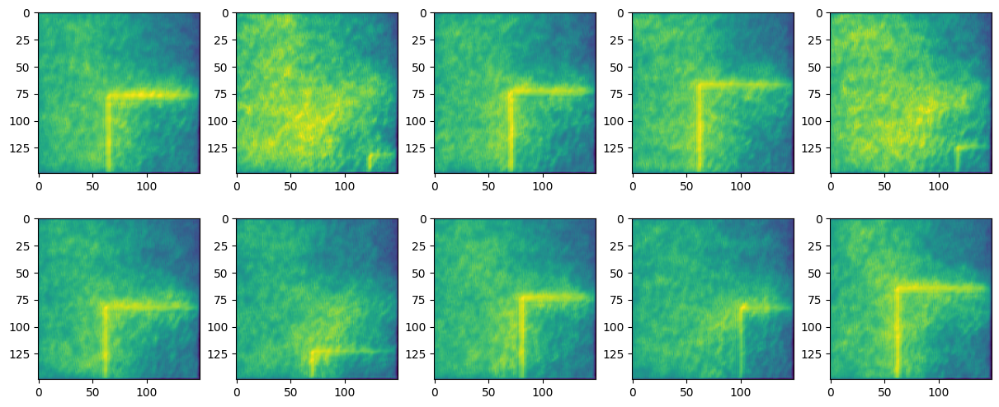

In [160]:
plt.figure(figsize=(12,5), layout='constrained')
for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.imshow(layer_outputs[31][i])
plt.show()